In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# Guideline steps to reach cluster segmentation 

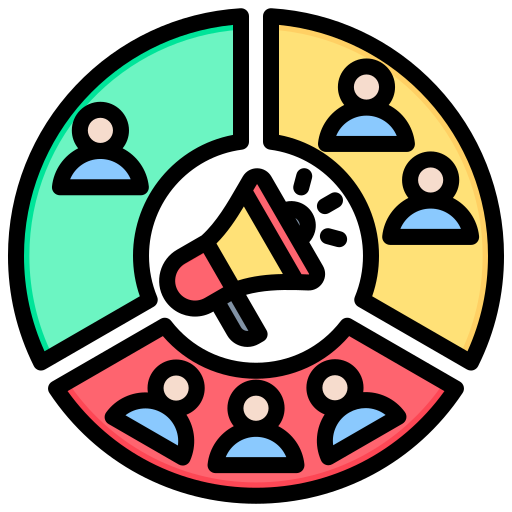

# 1. Read the dataset

In [2]:
#read the data

data_path = '/kaggle/input/ccdata/CC GENERAL.csv'  #the path where you downloaded the data
df = pd.read_csv(data_path)

print('The shape of the dataset is:', df.shape)

The shape of the dataset is: (8950, 18)


- **CUST_ID** : Identification of Credit Card holder (Categorical)
- **BALANCE** : Balance amount left in their account to make purchases (
- **BALANCE_FREQUENCY** : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
- **PURCHASES** : Amount of purchases made from account
- **ONEOFF_PURCHASES** : Maximum purchase amount done in one-go
- **INSTALLMENTS_PURCHASES** : Amount of purchase done in installment
- **CASH_ADVANCE** : Cash in advance given by the user
- **PURCHASES_FREQUENCY** : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
- **ONEOFFPURCHASESFREQUENCY** : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
- **PURCHASESINSTALLMENTSFREQUENCY** : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
- **CASHADVANCEFREQUENCY** : How frequently the cash in advance being paid
- **CASHADVANCETR** : Number of Transactions made with "Cash in Advanced"
- **PURCHASES_TRX** : Numbe of purchase transactions made
- **CREDIT_LIMIT** : Limit of Credit Card for user
- **PAYMENTS** : Amount of Payment done by user
- **MINIMUM_PAYMENTS** : Minimum amount of payments made by user
- **PRCFULLPAYMENT** : Percent of full payment paid by user
- **TENURE** : Tenure of credit card service for user

<!-- About Dataset
This case requires to develop a customer segmentation to define marketing strategy. The
sample Dataset summarizes the usage behavior of about 9000 active credit card holders during the last 6 months. The file is at a customer level with 18 behavioral variables.

Following is the Data Dictionary for Credit Card dataset :-

CUST_ID : Identification of Credit Card holder (Categorical)
BALANCE : Balance amount left in their account to make purchases (
BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
PURCHASES : Amount of purchases made from account
ONEOFF_PURCHASES : Maximum purchase amount done in one-go
INSTALLMENTS_PURCHASES : Amount of purchase done in installment
CASH_ADVANCE : Cash in advance given by the user
PURCHASES_FREQUENCY : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
ONEOFFPURCHASESFREQUENCY : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
PURCHASESINSTALLMENTSFREQUENCY : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
CASHADVANCEFREQUENCY : How frequently the cash in advance being paid
CASHADVANCETRX : Number of Transactions made with "Cash in Advanced"
PURCHASES_TRX : Numbe of purchase transactions made
CREDIT_LIMIT : Limit of Credit Card for user
PAYMENTS : Amount of Payment done by user
MINIMUM_PAYMENTS : Minimum amount of payments made by user
PRCFULLPAYMENT : Percent of full payment paid by user
TENURE : Tenure of credit card service for user -->

# 2. Data investigation

in this part you need to check the data quality and assess any issues in the data as:
- null values in each column 
- each column has the proper data type
- outliers
- duplicate rows
- distribution for each column (skewness)
<br>

In [3]:
# Let's see the data types and non-null values for each column
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [4]:
round(df.isnull().sum(axis=0)*100/df.shape[0],2)

CUST_ID                             0.00
BALANCE                             0.00
BALANCE_FREQUENCY                   0.00
PURCHASES                           0.00
ONEOFF_PURCHASES                    0.00
INSTALLMENTS_PURCHASES              0.00
CASH_ADVANCE                        0.00
PURCHASES_FREQUENCY                 0.00
ONEOFF_PURCHASES_FREQUENCY          0.00
PURCHASES_INSTALLMENTS_FREQUENCY    0.00
CASH_ADVANCE_FREQUENCY              0.00
CASH_ADVANCE_TRX                    0.00
PURCHASES_TRX                       0.00
CREDIT_LIMIT                        0.01
PAYMENTS                            0.00
MINIMUM_PAYMENTS                    3.50
PRC_FULL_PAYMENT                    0.00
TENURE                              0.00
dtype: float64

In [5]:
df.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

### there are 313 missing minimum payment

In [6]:
# This will print basic statistics for numerical columns
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


### The average balance across customers is 1564.47, with a median of 873.38, indicating a skewed distribution(BALANCE).

### The mean purchase amount is 1003.20, while the median is 361.28, indicating significant skewness(PURCHASES).

### On average, customers make purchases approximately 50% of the time(PURCHASES_FREQUENCY).

### Customers engage in an average of 15 purchase transactions(PURCHASES_TRX).

### On average, customers pay approximately **15%** of their full credit balance(PRC_FULL_PAYMENT).

In [7]:
# there is no duplicated rows
df.duplicated().sum()

0

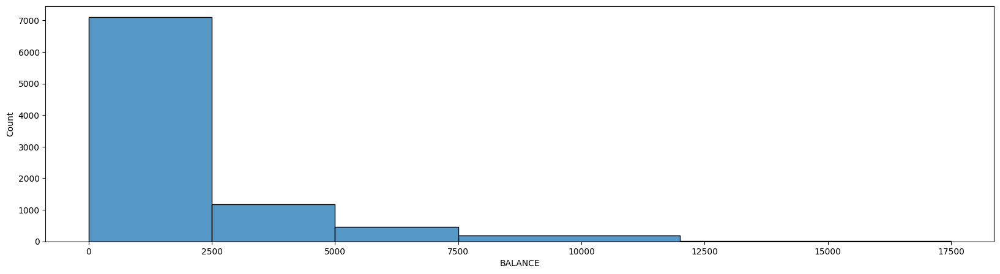

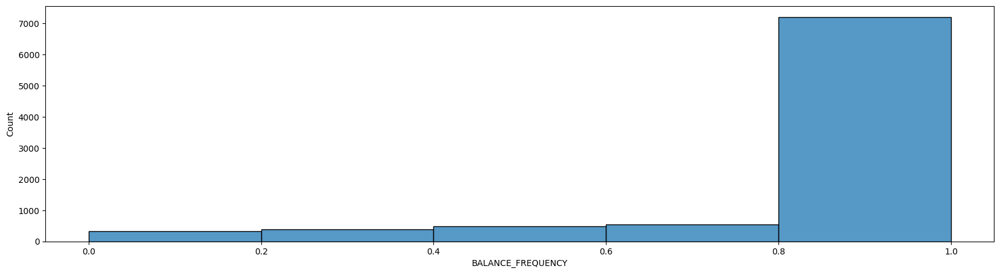

In [8]:
# feel free to investigate what you want
col = ["BALANCE" ,"BALANCE_FREQUENCY" ]
bins = [[0,2500,5000,7500 , 12000,15000 , 17500] , [0,0.2,0.4, 0.6,0.8 , 1] ]

for i in range(len(col)):
    plt.figure(figsize=(20,5))
    sns.histplot(data = df,x = col[i] , bins=bins[i])
    plt.show()

### most of the users are updating their balance frequently
### most of the user's balance is under 2500 

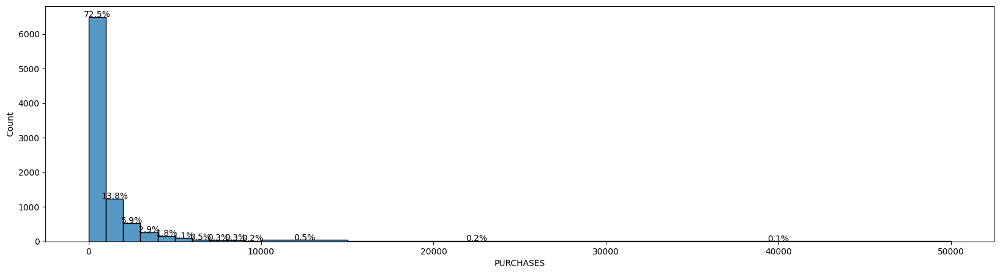

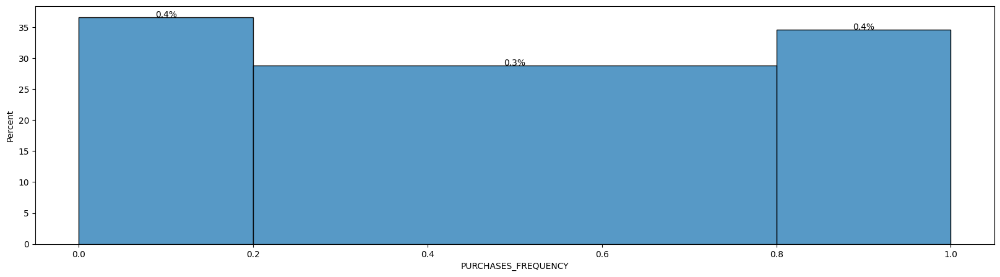

In [9]:
# feel free to investigate what you want
col = ['PURCHASES', 'PURCHASES_FREQUENCY']
bins = [[0,1000,2000,3000,4000,5000,6000,7000 ,8000 ,9000,10000 ,15000 , 30000 , 50000] , [0,0.2 ,0.8, 1] ]
stat = ['count' , 'percent']
for i in range(len(col)):
    plt.figure(figsize=(20,5))
    ax = sns.histplot(data = df,x = col[i] , bins=bins[i] , stat=stat[i] )
    
    total_count = len(df)
    
    patches = ax.patches
    for i in range(len(patches)):
        
        percentage = '{:.1f}%'.format(100 * (patches[i].get_height()/total_count))
        x = patches[i].get_x() + patches[i].get_width()/2
        y = patches[i].get_height()+.05
        ax.annotate(percentage, (x, y), ha='center')
    
    plt.show()

### Almost half of the people buy alot or don't buy at all
### there is a significance skewness in the purchases

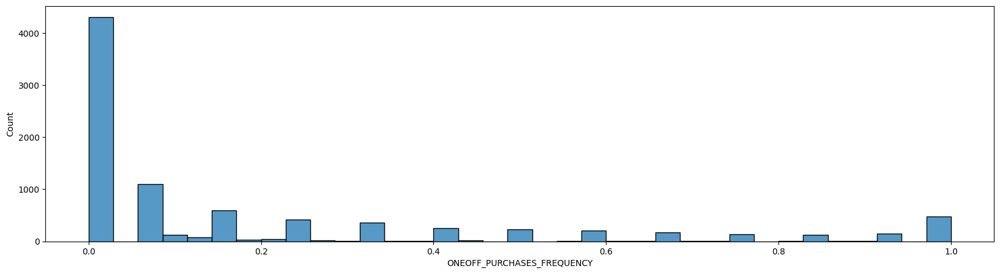

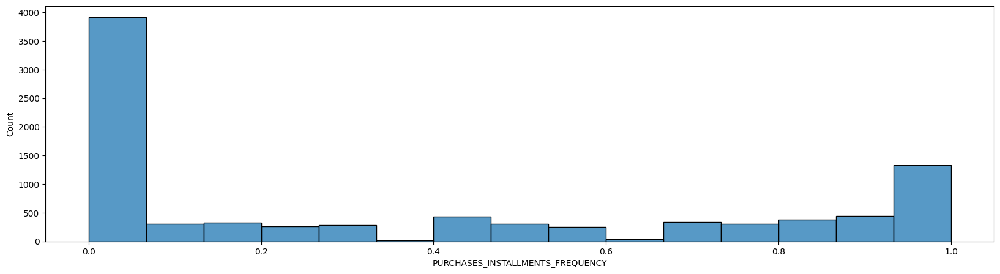

In [10]:
col = ['ONEOFF_PURCHASES_FREQUENCY','PURCHASES_INSTALLMENTS_FREQUENCY']
for i in range(len(col)):
    plt.figure(figsize=(20,5))
    sns.histplot(data = df,x = col[i] )
    plt.show()

### people tend to buy more with installement 

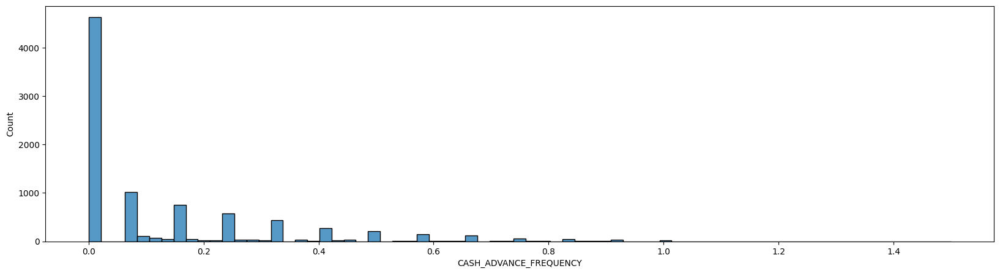

In [11]:
col = ['CASH_ADVANCE_FREQUENCY']
for i in range(len(col)):
    plt.figure(figsize=(20,5))
    sns.histplot(data = df,x = col[i])
    plt.show()

### cash in advance frequency is greater than one which is considered a problem with data integrity maybe so we must remove them

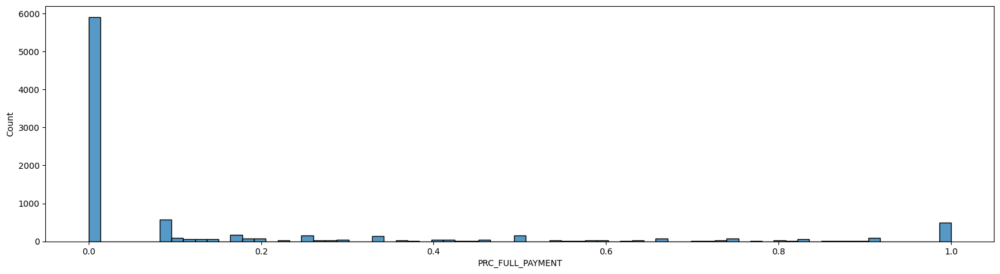

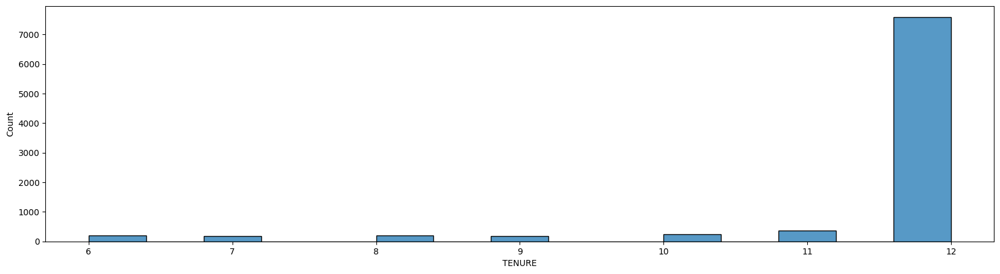

In [12]:
col = ['PRC_FULL_PAYMENT','TENURE']
for i in range(len(col)):
    plt.figure(figsize=(20,5))
    sns.histplot(data = df,x = col[i])
    plt.show()

### most of users almost didn't pay any amount of the payment
### most of users have their credit for 12 months

### Outliers

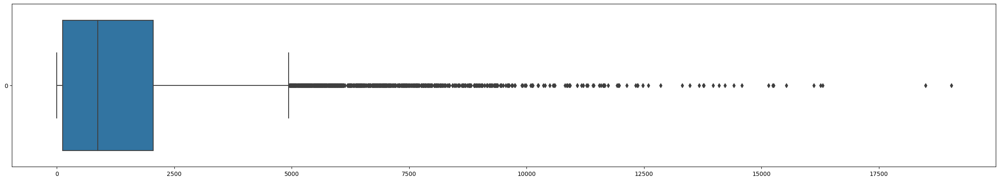

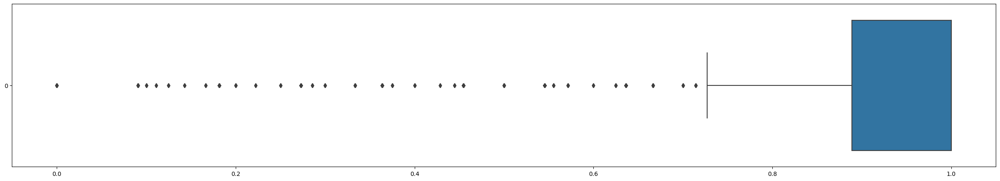

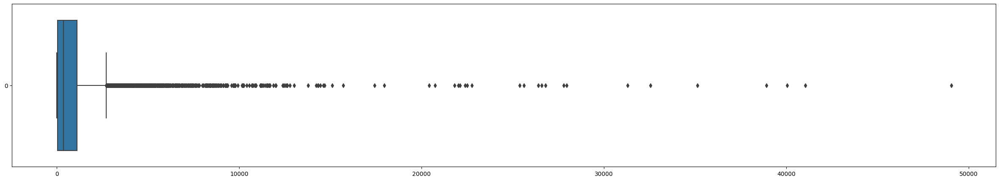

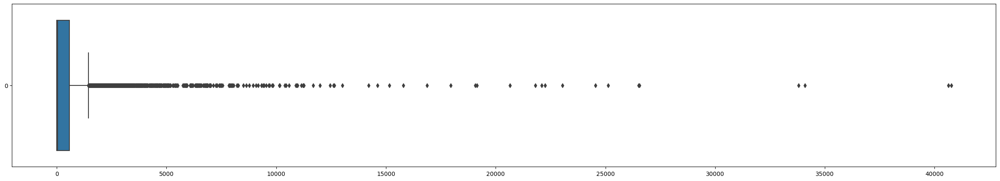

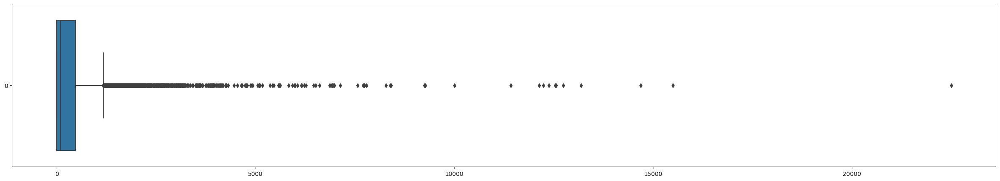

...

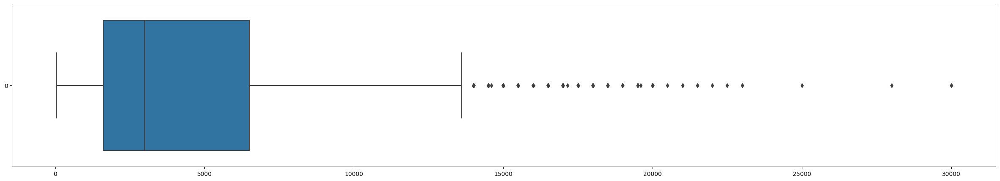

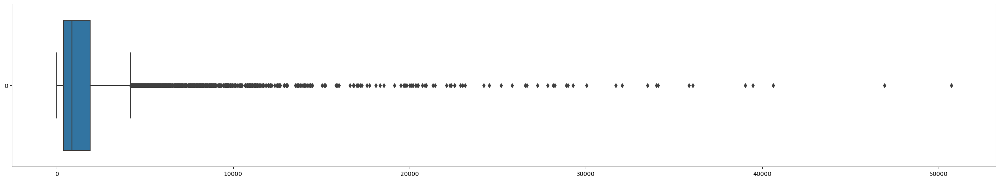

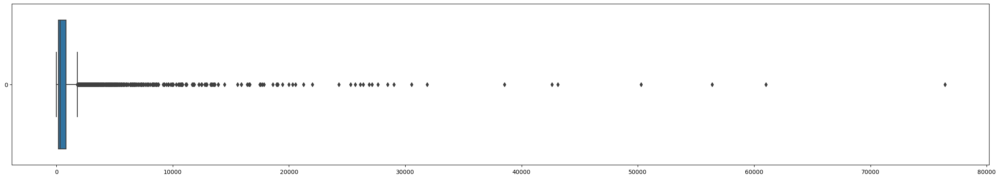

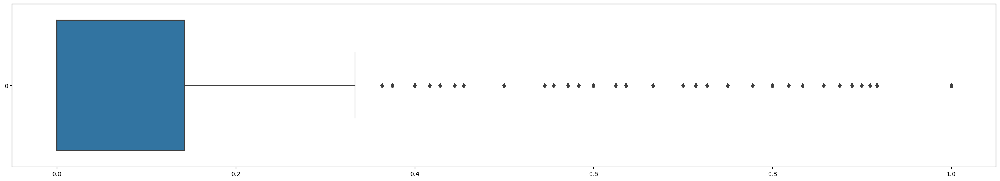

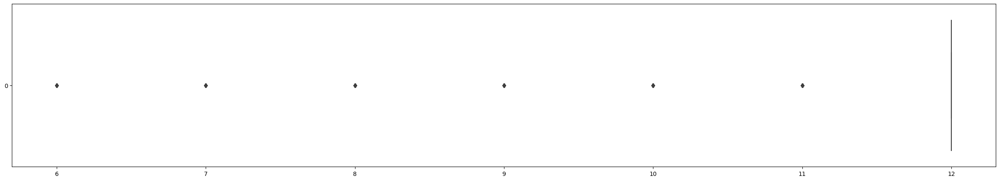

In [13]:
for column in df.columns[1:]:
    plt.figure(figsize = (30,5))
    sns.boxplot(df[column] , orient='h')
    plt.show()

### there is alot of outliers which may be important to us so we won't consider them outliers except only intersection of one percent 


<Axes: >

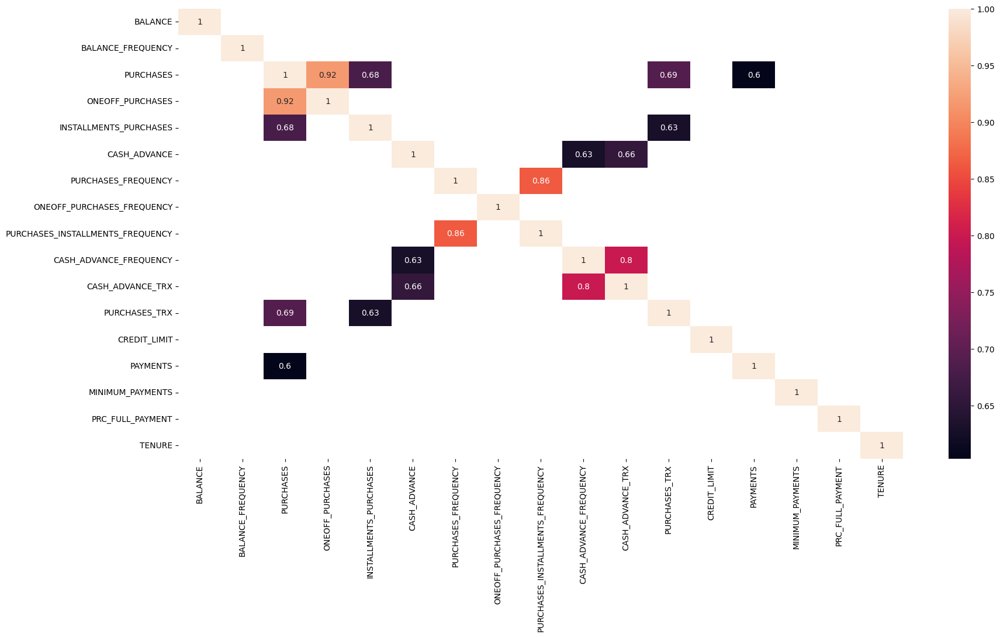

In [14]:
plt.figure(figsize=(20,10))
coorlation = df.iloc[:,1:].corr()
thresh = 0.6
sns.heatmap(coorlation[abs(coorlation) > thresh] , annot=True)

### one-off purchases almost the same as purchases and that is because one-off purchases is always a huge number that affect  the total purchases more than the installment purchases 

### so we don't need one-off purchases column but we need only the frequency of it

###  there is a linear correlation between the frequency and the cash_dvance or the purchases which is logical

### as the balance increase payments and minimum payment increase which is logical

### as the balnce increase there is a tendency that people don't pay a high percent of the payment

**Note** <br>
Balance = Previous Balance+New Purchases+Cash Advances <br>
          +Balance Transfers+Fees+Interest Charges−Payments−Credits

<Axes: xlabel='BALANCE', ylabel='PURCHASES'>

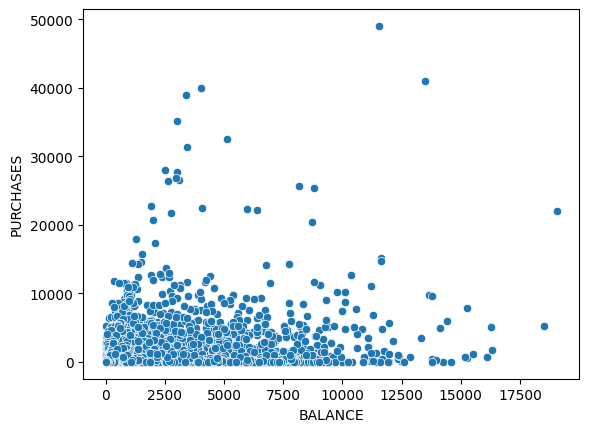

In [15]:
sns.scatterplot(data=df , x='BALANCE' , y='PURCHASES')

### when debt increase purchases decrease which could mean one of the following

### 1- the more the debt increse the more the interest will increase the debt so may be users with higher debt are failing to payback so they decrease their purchases

### 2- people who have higher debt tend to be more mature 

<Axes: xlabel='CREDIT_LIMIT', ylabel='BALANCE'>

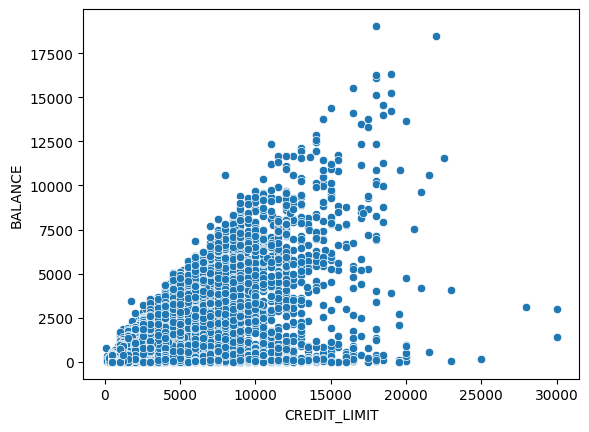

In [16]:
sns.scatterplot(data=df , x='CREDIT_LIMIT' , y='BALANCE')

### we can see that when credit limit increase balance increase which means debt is more when you have a higher flexibility in credit card limit

# 3. Data preprocessing

### Define below all the issues that you had found in the previous part
1- Nulls          <br>
2- cash advance Frequency greater than one(Data integrity)          <br>
3- outliers          <br>
4- No need cusomer_id column , one_offpurchases , minimum payment <br> 


In [17]:
#make a copy for the original dataset
df_copy=df.copy()

### for each issue adapt this methodology 
- start by defining the solution
- apply this solution onn the data
- test the solution to make sure that you have solved the issue

**Nulls**

**I will fill them using knn imputer to be more accurate**

In [18]:
#solution
from sklearn.impute import KNNImputer
import numpy as np

imputer = KNNImputer(n_neighbors=2)

# Impute missing values
df_copy['MINIMUM_PAYMENTS'] = imputer.fit_transform(df_copy[['MINIMUM_PAYMENTS']])

In [19]:
#solution
df_copy['CREDIT_LIMIT'] = df_copy['CREDIT_LIMIT'].fillna(df_copy['CREDIT_LIMIT'].median())

In [20]:
# test
df_copy.isna().sum()

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

**cash advance Frequency greater than one(Data integrity)**

In [21]:
# I will remove these elements
df_copy[df_copy['CASH_ADVANCE_FREQUENCY']>1]

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
681,C10708,5656.069801,1.000000,362.36,362.36,0.0,7240.433194,0.250000,0.250000,0.0,1.250000,12,2,8000.0,683.421497,2036.877611,0.0,8
1626,C11680,2876.009336,1.000000,152.61,152.61,0.0,3719.650168,0.333333,0.333333,0.0,1.166667,24,2,4000.0,248.342971,584.926336,0.0,6
2555,C12629,5906.184924,1.000000,141.80,141.80,0.0,1651.286918,0.125000,0.125000,0.0,1.125000,12,2,10000.0,933.969974,919.289675,0.0,8
2608,C12684,7801.511533,1.000000,231.40,231.40,0.0,4109.465221,0.100000,0.100000,0.0,1.100000,20,3,13500.0,1593.617739,1522.496755,0.0,10
3038,C13127,3846.742530,1.000000,0.00,0.00,0.0,1932.460679,0.000000,0.000000,0.0,1.500000,18,0,5600.0,496.245836,538.346874,0.0,6
3253,C13347,5709.486507,0.833333,0.00,0.00,0.0,2794.326341,0.000000,0.000000,0.0,1.166667,10,0,6000.0,550.513331,1299.463370,0.0,6
8055,C18273,1917.895730,1.000000,285.07,285.07,0.0,6084.858872,0.363636,0.363636,0.0,1.090909,28,6,3000.0,5692.682993,556.449635,0.0,11
8365,C18588,3857.562230,1.000000,0.00,0.00,0.0,2127.213754,0.000000,0.000000,0.0,1.142857,26,0,5000.0,617.508991,538.396872,0.0,7


In [22]:
# let's remove frequencies greater than 1
df_copy = df_copy[df_copy['CASH_ADVANCE_FREQUENCY']<=1]
df_copy.reset_index(drop=True, inplace=True)

In [23]:
df_copy

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8937,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8938,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,864.206542,0.000000,6
8939,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8940,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


**outliers**

In [24]:
# Removing outliers for BALANCE
Q1b = df_copy['BALANCE'].quantile(0.01)
Q3b = df_copy['BALANCE'].quantile(0.99)
IQRb = Q3b - Q1b

# Removing outliers for PURCHASES
Q1p = df_copy['PURCHASES'].quantile(0.01)
Q3p = df_copy['PURCHASES'].quantile(0.99)
IQRp = Q3p - Q3p

# Removing outliers for CASH_ADVANCE
Q1c = df_copy['CASH_ADVANCE'].quantile(0.01)
Q3c = df_copy['CASH_ADVANCE'].quantile(0.99)
IQRc = Q3c - Q1c

# Removing outliers for CREDIT_LIMIT
Q1C = df_copy['CREDIT_LIMIT'].quantile(0.01)
Q3C = df_copy['CREDIT_LIMIT'].quantile(0.99)
IQRC = Q3C - Q1C

# Removing outliers for payment
Q1y = df_copy['PAYMENTS'].quantile(0.01)
Q3y = df_copy['PAYMENTS'].quantile(0.99)
IQRy = Q3y - Q1y

# Removing outliers for minimum payment
#Q1m = df_copy['MINIMUM_PAYMENTS'].quantile(0.01)
#Q3m = df_copy['MINIMUM_PAYMENTS'].quantile(0.99)
#IQRm = Q3m - Q1m

dfnew = df_copy[(df_copy['BALANCE'] >= Q1b - 1.5*IQRb) & (df_copy['BALANCE'] <= Q3b + 1.5*IQRb)&
        (df_copy['PURCHASES'] >= Q1p - 1.5*IQRp) & (df_copy['PURCHASES'] <= Q3p + 1.5*IQRp)&
        (df_copy['CASH_ADVANCE'] >= Q1c - 1.5*IQRc) & (df_copy['CASH_ADVANCE'] <= Q3c + 1.5*IQRc)&
        (df_copy['CREDIT_LIMIT'] >= Q1C - 1.5*IQRC) & (df_copy['CREDIT_LIMIT'] <= Q3C + 1.5*IQRC)&
        (df_copy['PAYMENTS'] >= Q1y - 1.5*IQRy) & (df_copy['PAYMENTS'] <= Q3y + 1.5*IQRy)
       ]

In [25]:
# test
dfnew.reset_index(drop=True, inplace=True)

In [26]:
dfnew_copy_original = dfnew.copy()

**No need cusomer_id column , one_offpurchases , minimum payment**

In [27]:
# solution
dfnew.drop('CUST_ID' ,  axis=1 , inplace=True)
dfnew.drop('ONEOFF_PURCHASES' ,  axis=1 , inplace=True)
dfnew.drop('MINIMUM_PAYMENTS' ,  axis=1 , inplace=True)


In [28]:
# test
dfnew.reset_index(drop=True, inplace=True)

In [29]:
dfnew_copy = dfnew.copy()

# 4. Features transformation

# we will plot all features distribution in order to apply log transformation on high skewness features to be normal distribution 

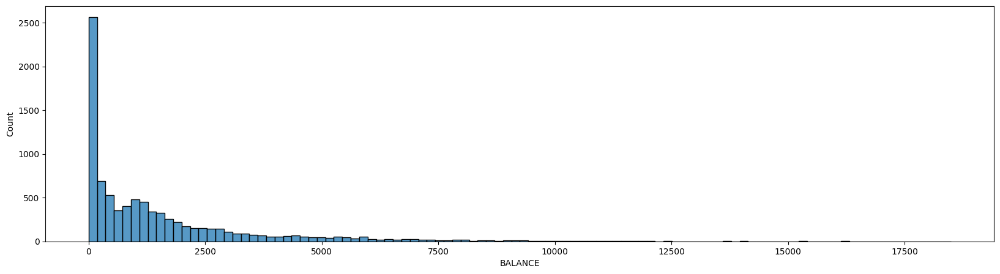

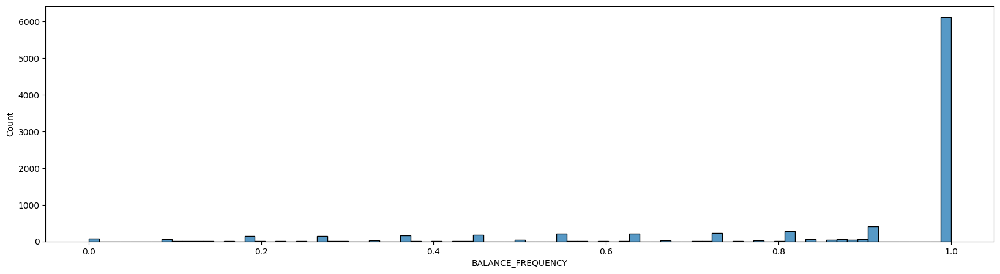

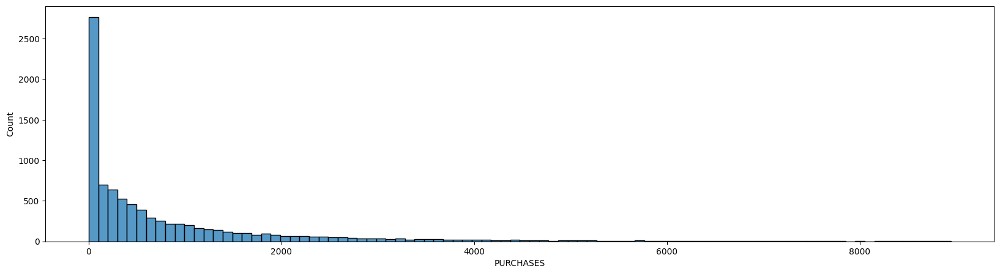

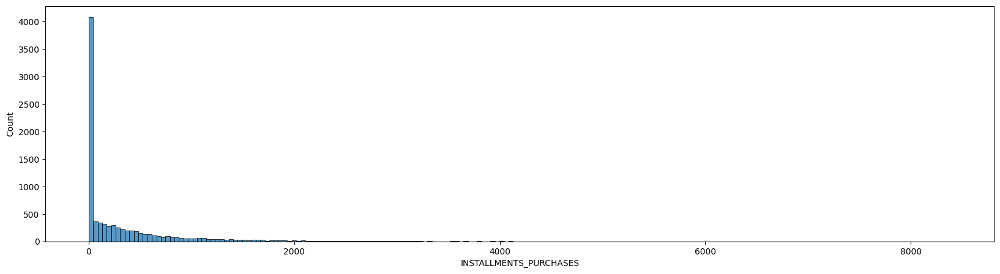

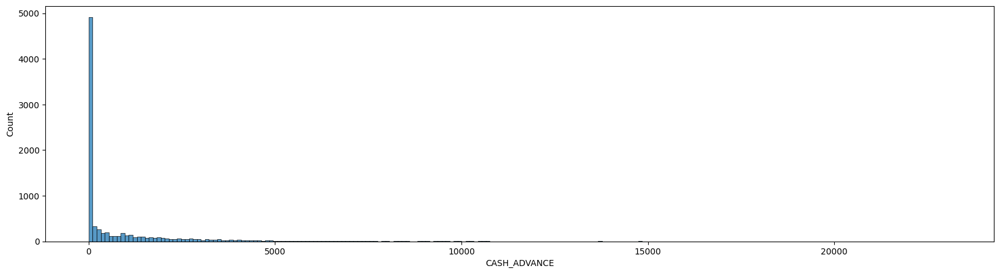

...

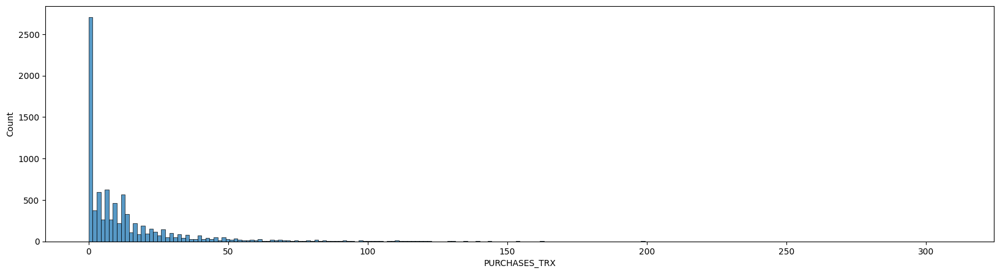

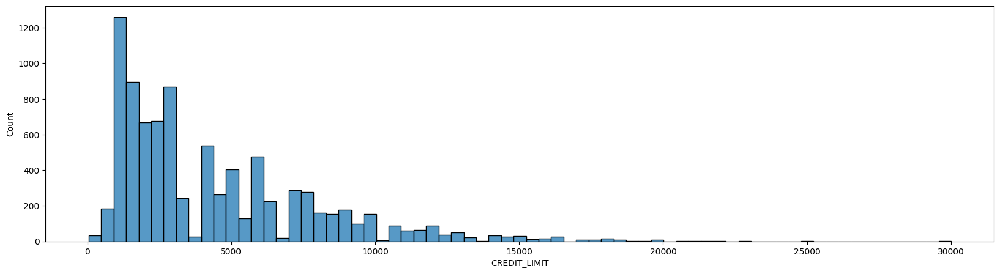

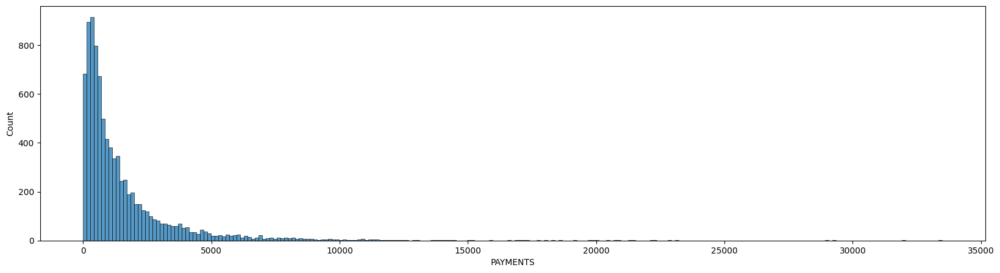

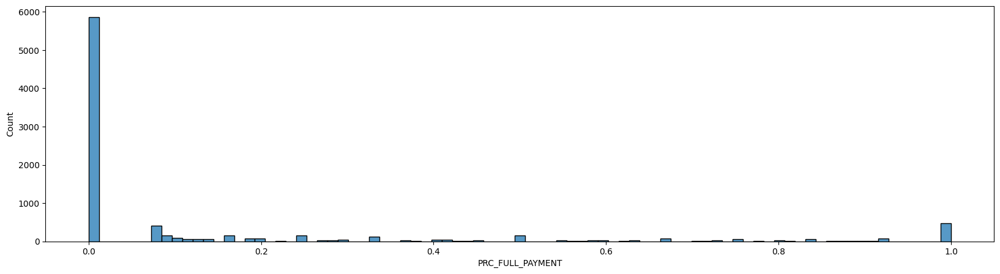

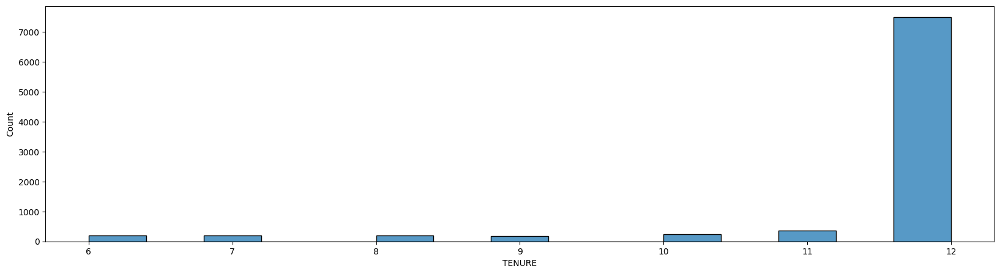

In [31]:
col = dfnew.columns
for i in range(len(col)):
    plt.figure(figsize=(20,5))
    sns.histplot(data = dfnew,x = col[i])
    plt.show()

In [32]:
from sklearn.preprocessing import StandardScaler , RobustScaler 

In [33]:
# we choose columns with high skewness and we removed columns that is already normalized
col = ['BALANCE', 'PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS']
for c in col:
    dfnew[c] = dfnew[c] + 1e-4 # small constant to overcome zero in the log

    # Apply log transformation
    dfnew[c] = np.log(dfnew[c])

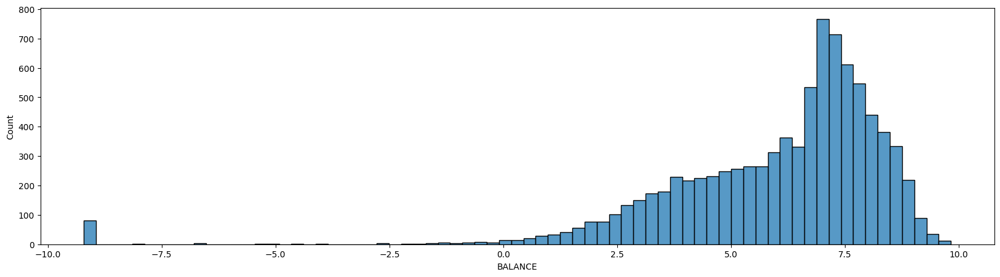

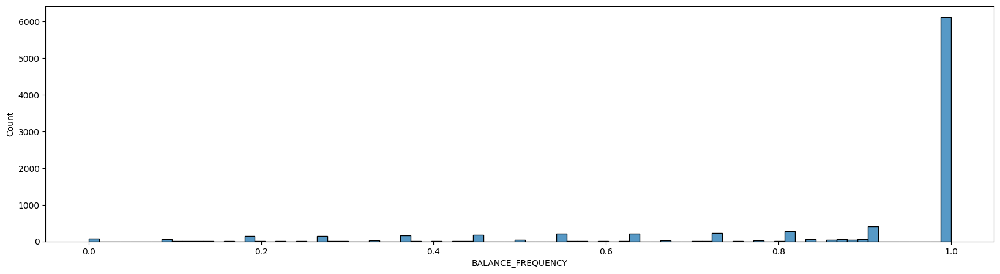

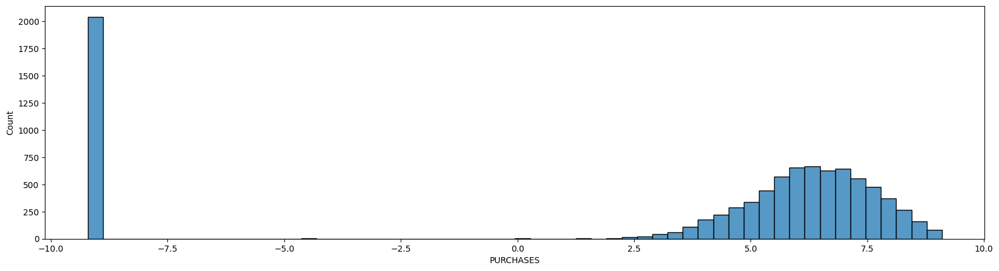

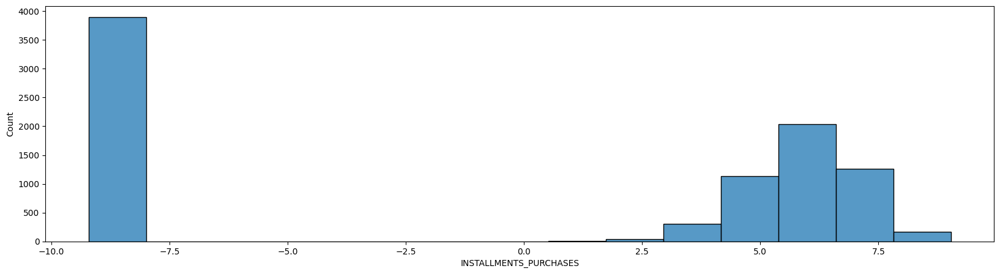

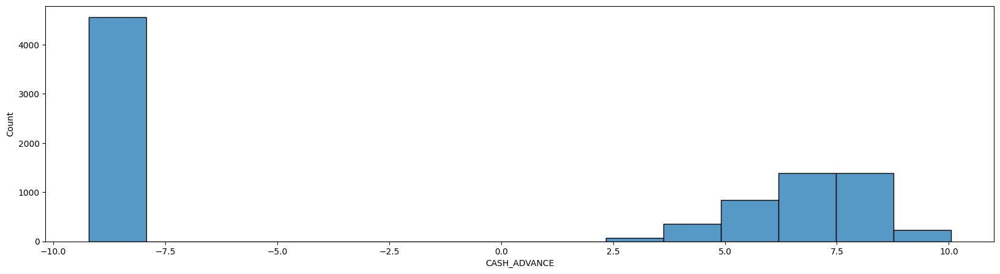

...

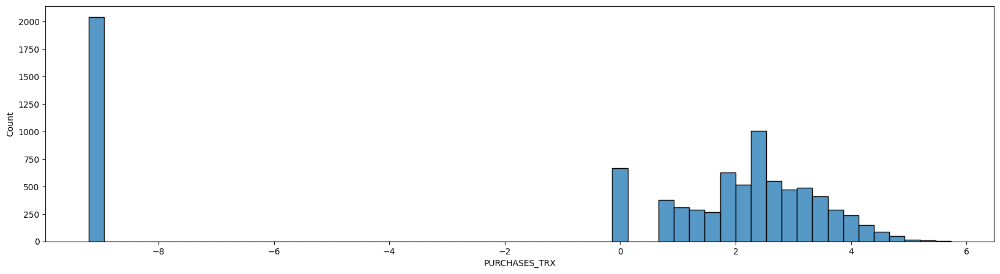

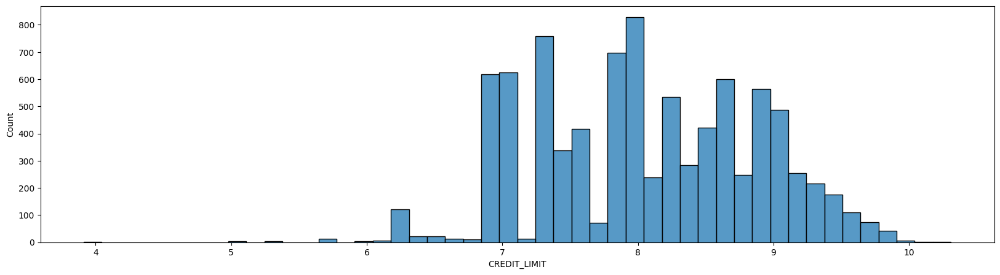

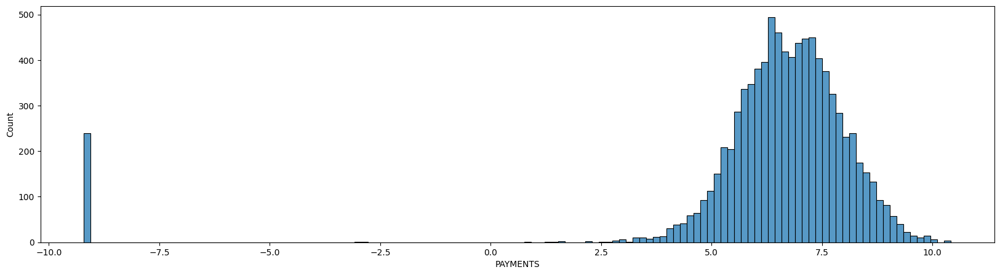

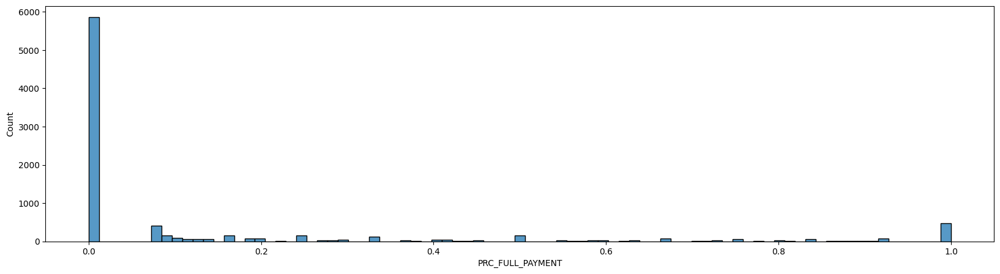

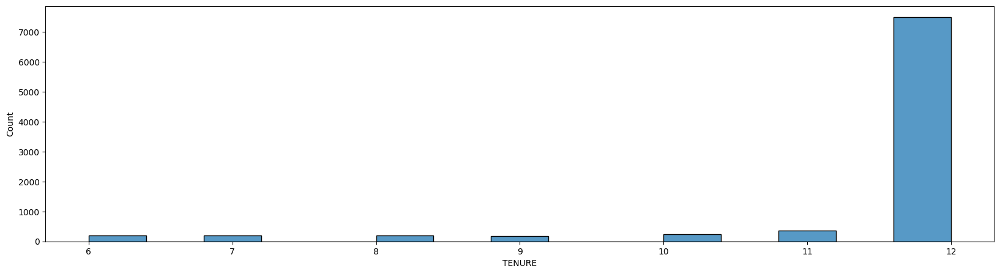

In [34]:
col = dfnew.columns
for i in range(len(col)):
    plt.figure(figsize=(20,5))
    sns.histplot(data = dfnew,x = col[i])
    plt.show()

In [35]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE 

In [36]:
def draw_tsne(data , c=None):
    tsne = TSNE(n_components=2)
    tsne_data = tsne.fit_transform(data)

    plt.figure(figsize=(20,10))
    plt.scatter(tsne_data[:, 0], tsne_data[:, 1],c=c ,  cmap='viridis')
    plt.title('tsne Cluster Visualization')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Cluster')
    plt.show()

    

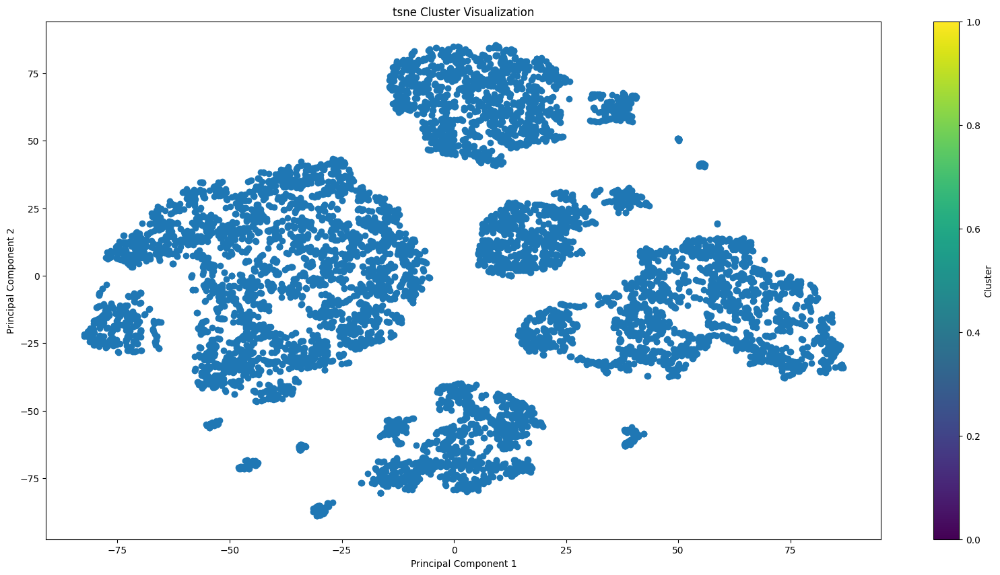

In [37]:
# lets see data after log transformation to compare between it and after scaling to see if scaling will help us
draw_tsne(dfnew)

In [38]:
# then we apply standard scaler to deal with outliers and make data in same range approximately
scaler = StandardScaler()
data_scaled = scaler.fit_transform(dfnew)
#data_scaled_df = pd.DataFrame(data_scaled, columns=dfnew.columns)


In [39]:
# Robustscaler
scaler = RobustScaler()
data_scaled2 = scaler.fit_transform(dfnew)
#data_scaled2_df = pd.DataFrame(data_scaled2, columns=dfnew.columns)


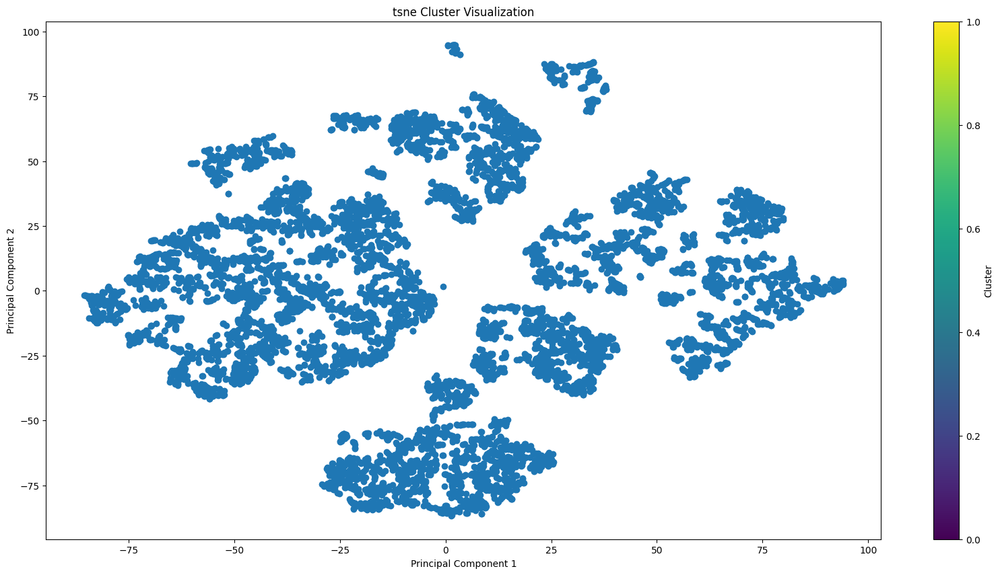

In [40]:
# this is tsne after scaling we can see that standard scaling made it more worse
draw_tsne(data_scaled)

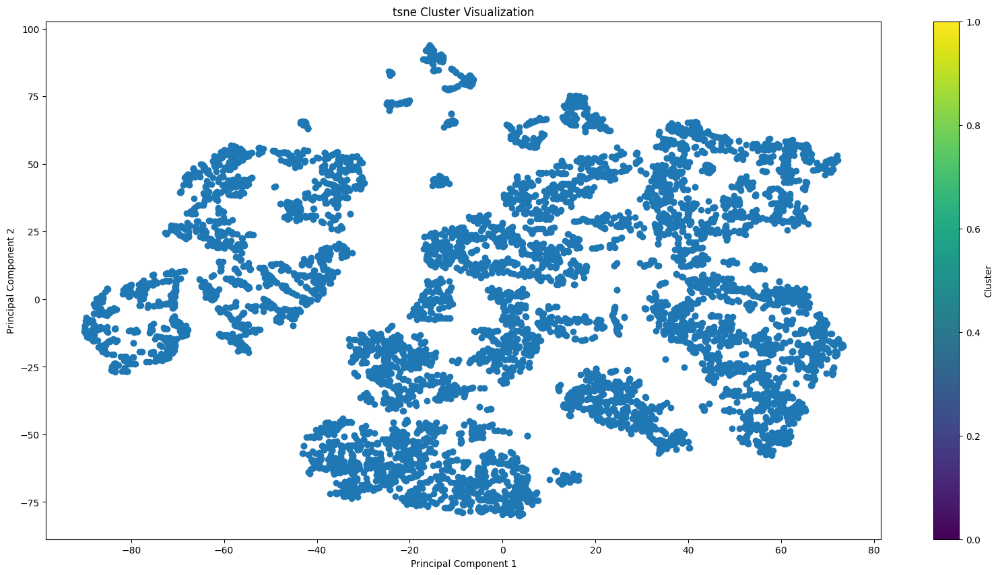

In [41]:
# this is tsne after scaling we can see that robust scaling made it even more worse
draw_tsne(data_scaled2)

In [42]:
pca = PCA(n_components=0.9)
pca_data_without_scaling = pca.fit_transform(dfnew)

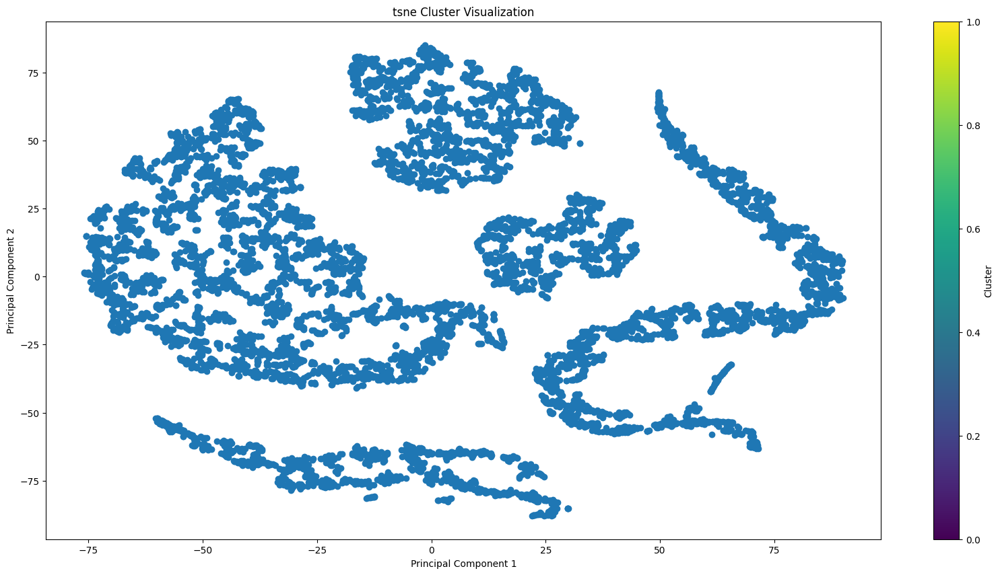

In [43]:
draw_tsne(pca_data_without_scaling)

In [44]:
# pca with 0.999 make the tsne better in seperation with only 6 component
# ofcourse I tried alot of values for n_components and found that this was the best value according to tsne 
pca = PCA(n_components=0.999)
pca_data_without_scaling = pca.fit_transform(dfnew)

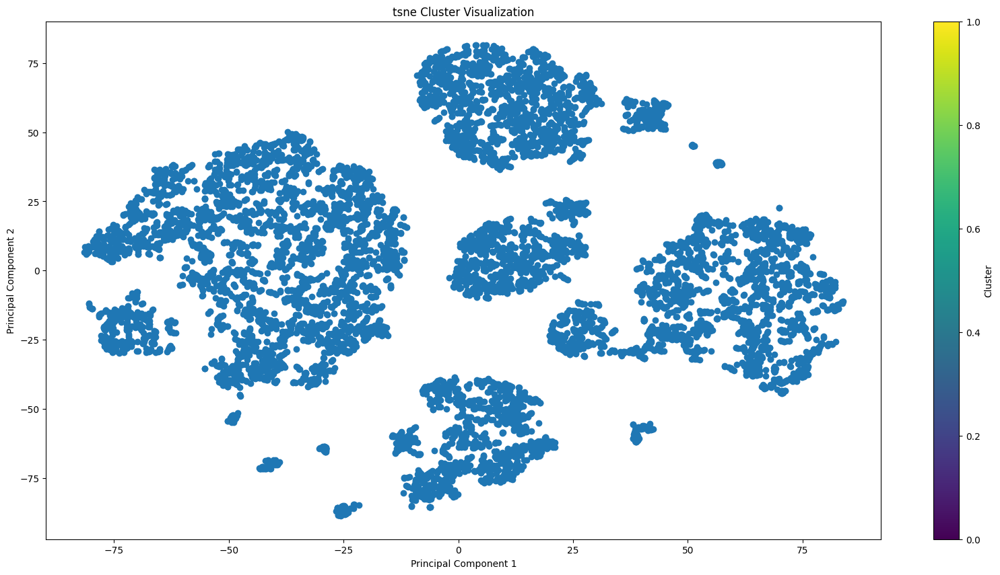

In [45]:
draw_tsne(pca_data_without_scaling)

### we can see that the clusters are more compact after using pca

# 5. K Means before pca

### elbow method vs distortion method vs silhouette for data before pca

In [47]:
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans

def determine_k(data_scaled):
    wcss = []
    distortions=[]
    sil=[]
    for i in range(1,15): 
        km = KMeans(n_clusters=i , random_state=42)
        km.fit(data_scaled)
        wcss.append(km.inertia_)
        distortions.append(sum(np.min(cdist(data_scaled, km.cluster_centers_, 'euclidean'), axis=1)**2) / data_scaled.shape[0])
        if i > 1: 
            sil.append(silhouette_score(data_scaled, km.labels_, metric = 'euclidean'))
    
    return wcss , distortions , sil


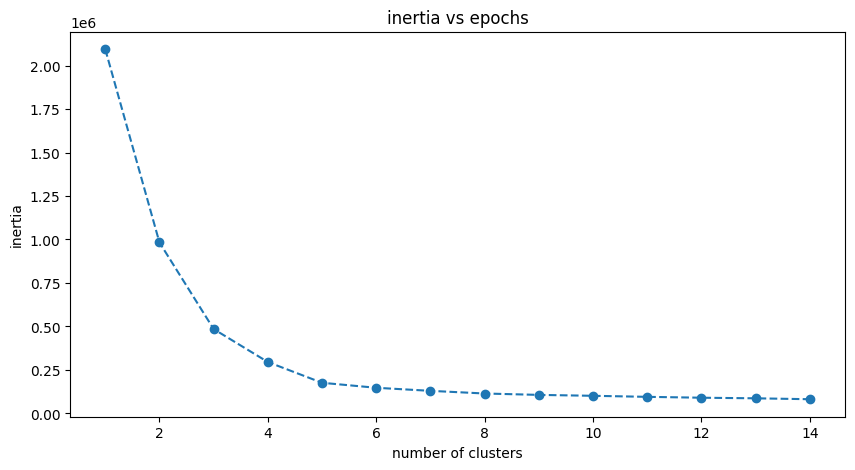

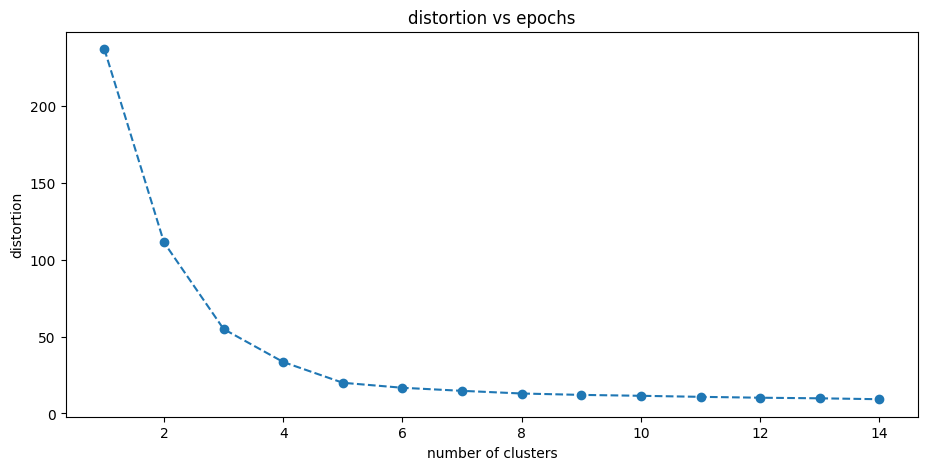

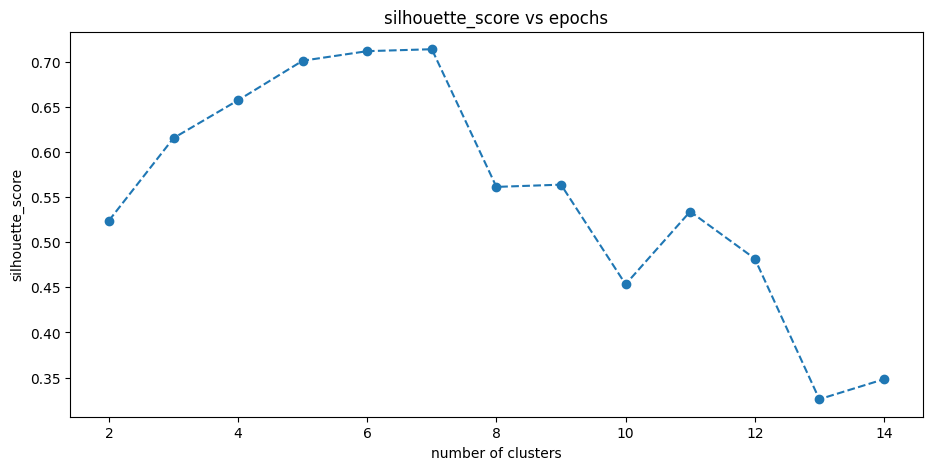

In [48]:
wcss , distortions , sil = determine_k(dfnew)

plt.figure(figsize=(10,5))
plt.plot(range(1,15),wcss, marker='o', linestyle='--')

plt.title('inertia vs epochs')
plt.xlabel('number of clusters')
plt.ylabel('inertia')
plt.show()


plt.figure(figsize=(11,5))
plt.plot(range(1,15),distortions, marker='o', linestyle='--')

plt.title('distortion vs epochs')
plt.xlabel('number of clusters')
plt.ylabel('distortion')
plt.show()

plt.figure(figsize=(11,5))
plt.plot(range(2,15),sil, marker='o', linestyle='--')

plt.title('silhouette_score vs epochs')
plt.xlabel('number of clusters')
plt.ylabel('silhouette_score')
plt.show()



In [50]:
# this library will help you determine the exact elbow in case you cannot determine it
#pip install kneed

Note: you may need to restart the kernel to use updated packages.


In [51]:
# this library will find the elbow automatically 
from kneed import KneeLocator
kl = KneeLocator(range(1, 15), wcss, curve="convex", direction="decreasing")
kl.elbow

4

In [52]:
# this library will find the elbow automatically 
from kneed import KneeLocator
kl = KneeLocator(range(1, 15), distortions, curve="convex", direction="decreasing")
kl.elbow

4

In [53]:
# this is the best number using ssilhouette_score
np.argmax(sil)+2

7

In [54]:
# this is the ssilhouette_score score of 7 clusters 
sil[5]

0.7137952169184079

I will choose the optimal number to be 5 clusters (taking the average)

**note**
we don't rely too much on the results of ssilhouette_score or elbow but we must confirm with the tsne plot to know the best number of clusters

In [55]:
from sklearn.cluster import KMeans
kmeans1 = KMeans(n_clusters=5 )
kmeans1.fit(data_scaled)

KMeans(n_clusters=5)

In [56]:
dfnew2 = dfnew.copy()
dfnew2['cluster1'] = kmeans1.predict(dfnew)


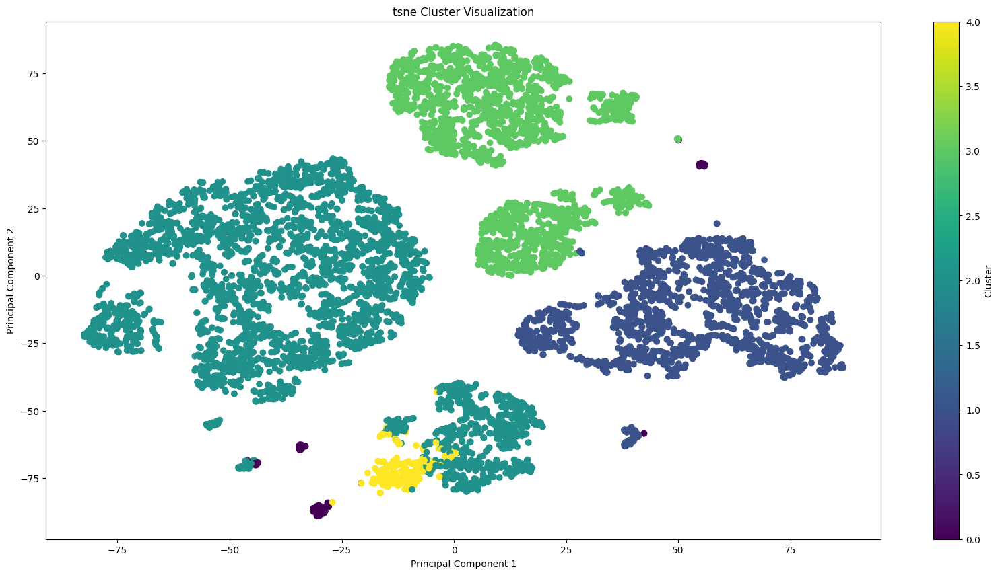

In [57]:
draw_tsne(dfnew , kmeans1.predict(dfnew))

### we can see that results are so bad using tsne

In [58]:
def plot3 (data24 , clusterName='cluster1'):
    columns_to_plot = ['BALANCE','PURCHASES','CASH_ADVANCE', 'CREDIT_LIMIT' ,
                   'PAYMENTS', 'MINIMUM_PAYMENTS', clusterName]
    sns.pairplot(data24 [columns_to_plot],  hue=clusterName, corner=True ,palette='dark' )

### lets see pca and tsne

# 6. dbscan after pca

### lets draw k-distance graph to choose the best epsion for dbscan

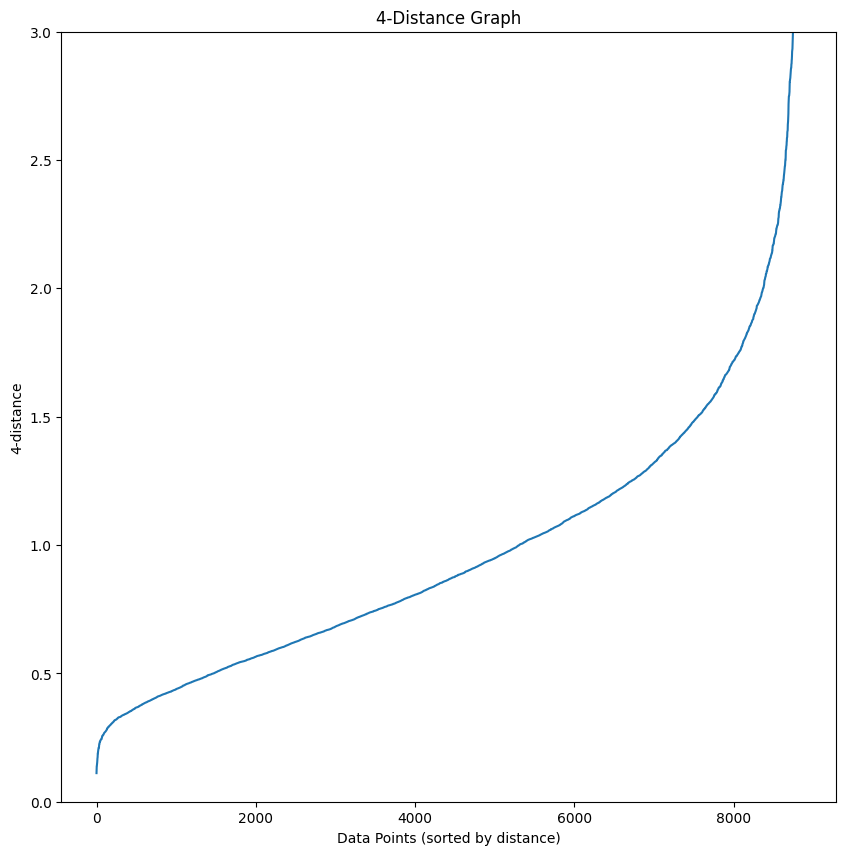

In [59]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

# Compute k-distance graph
k = 4  # Number of nearest neighbors
nbrs = NearestNeighbors(n_neighbors=k).fit(pca_data_without_scaling)
distances, _ = nbrs.kneighbors(pca_data_without_scaling)
k_distances = distances[:, -1]

# Sort distances in descending order
k_distances_sorted = np.sort(k_distances)[::-1]

# Plot k-distance graph
plt.figure(figsize=(10,10))
plt.plot(np.arange(len(k_distances_sorted[::-1])), k_distances_sorted[::-1])
plt.xlabel('Data Points (sorted by distance)')
plt.ylabel(f'{k}-distance')
plt.title(f'{k}-Distance Graph')
plt.ylim(0,3)
plt.show()

In [61]:
# from the above graph we can determine the best number for epsilon hyperparameter in dbscan
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=1, min_samples=2).fit(pca_data_without_scaling)

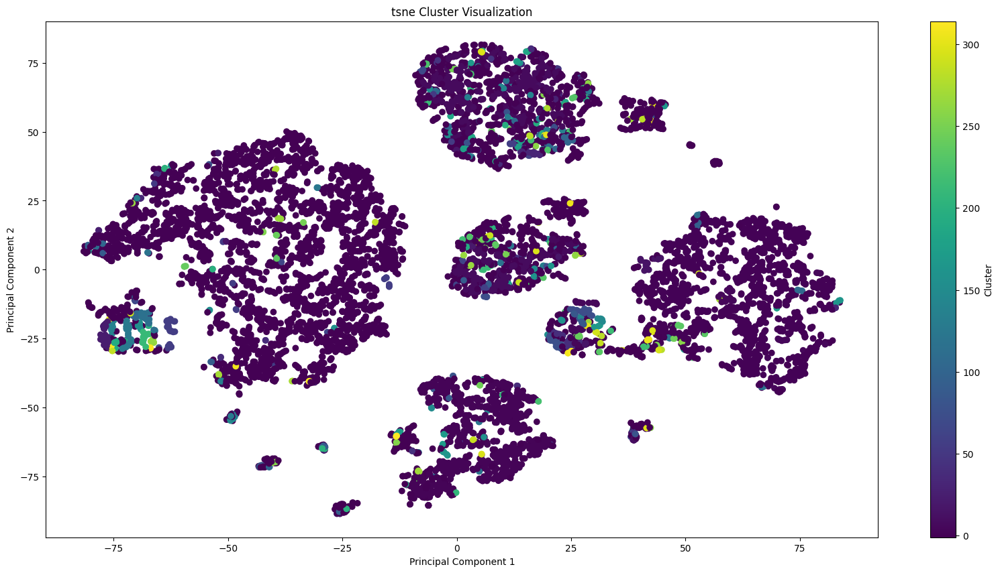

In [62]:
draw_tsne(pca_data_without_scaling , c=clustering.labels_)

### we can see that dbscan results are very bad

# 7. kmeans after pca

In [63]:
#pca
wcss , distortions , sil = determine_k(pca_data_without_scaling)


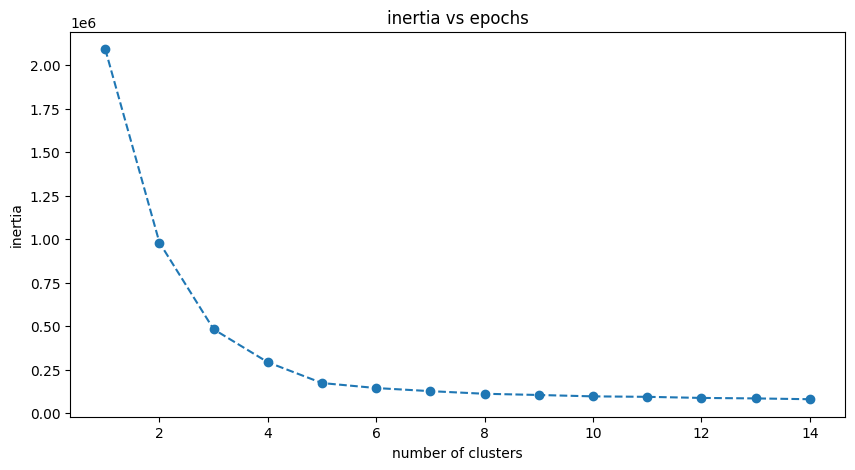

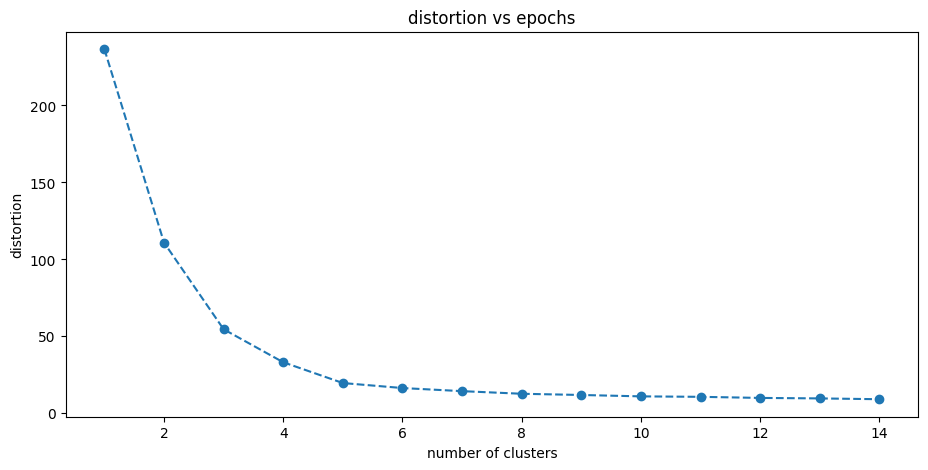

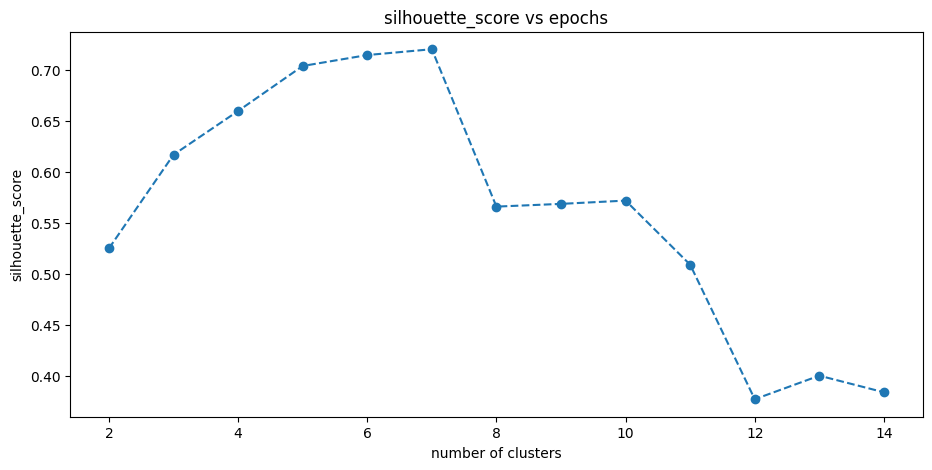

In [64]:
wcss , distortions , sil = determine_k(pca_data_without_scaling)

plt.figure(figsize=(10,5))
plt.plot(range(1,15),wcss, marker='o', linestyle='--')

plt.title('inertia vs epochs')
plt.xlabel('number of clusters')
plt.ylabel('inertia')
plt.show()


plt.figure(figsize=(11,5))
plt.plot(range(1,15),distortions, marker='o', linestyle='--')

plt.title('distortion vs epochs')
plt.xlabel('number of clusters')
plt.ylabel('distortion')
plt.show()

plt.figure(figsize=(11,5))
plt.plot(range(2,15),sil, marker='o', linestyle='--')

plt.title('silhouette_score vs epochs')
plt.xlabel('number of clusters')
plt.ylabel('silhouette_score')
plt.show()



In [65]:
# this is the best number using ssilhouette_score
np.argmax(sil)+2

7

In [66]:
# this library will find the elbow automatically 
from kneed import KneeLocator
kl = KneeLocator(range(1, 15), wcss, curve="convex", direction="decreasing")
kl.elbow

4

In [67]:
sil[4]

0.7147415232708103

In [68]:
# I will take the average to be number of clusters
from sklearn.cluster import KMeans
kmeans7 = KMeans(n_clusters=5 )
kmeans7.fit(pca_data_without_scaling)

KMeans(n_clusters=5)

In [69]:
dfnew2['pca_clusters'] = kmeans7.predict(pca_data_without_scaling)

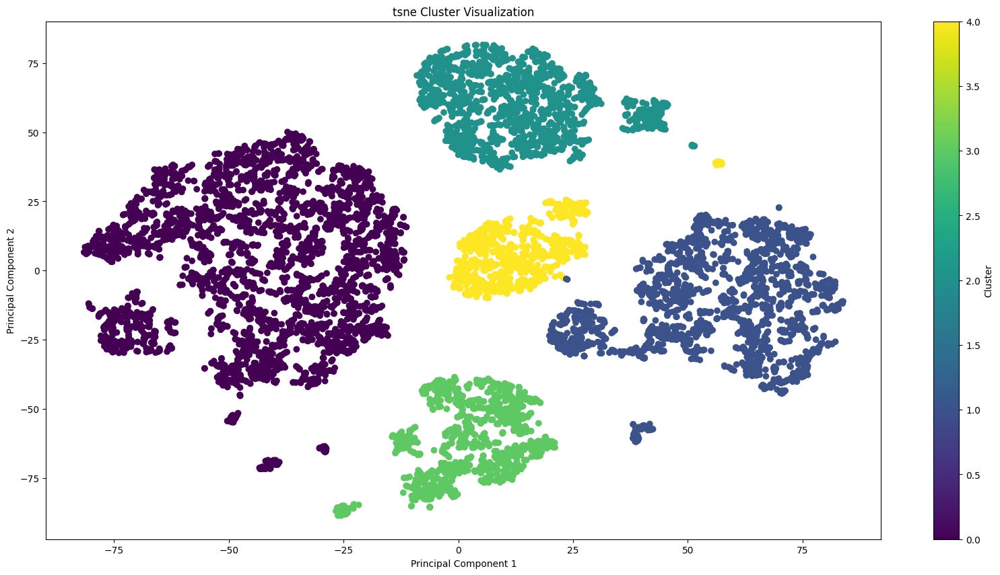

In [70]:
draw_tsne(pca_data_without_scaling , c=kmeans7.predict(pca_data_without_scaling))

<Figure size 2000x2000 with 0 Axes>

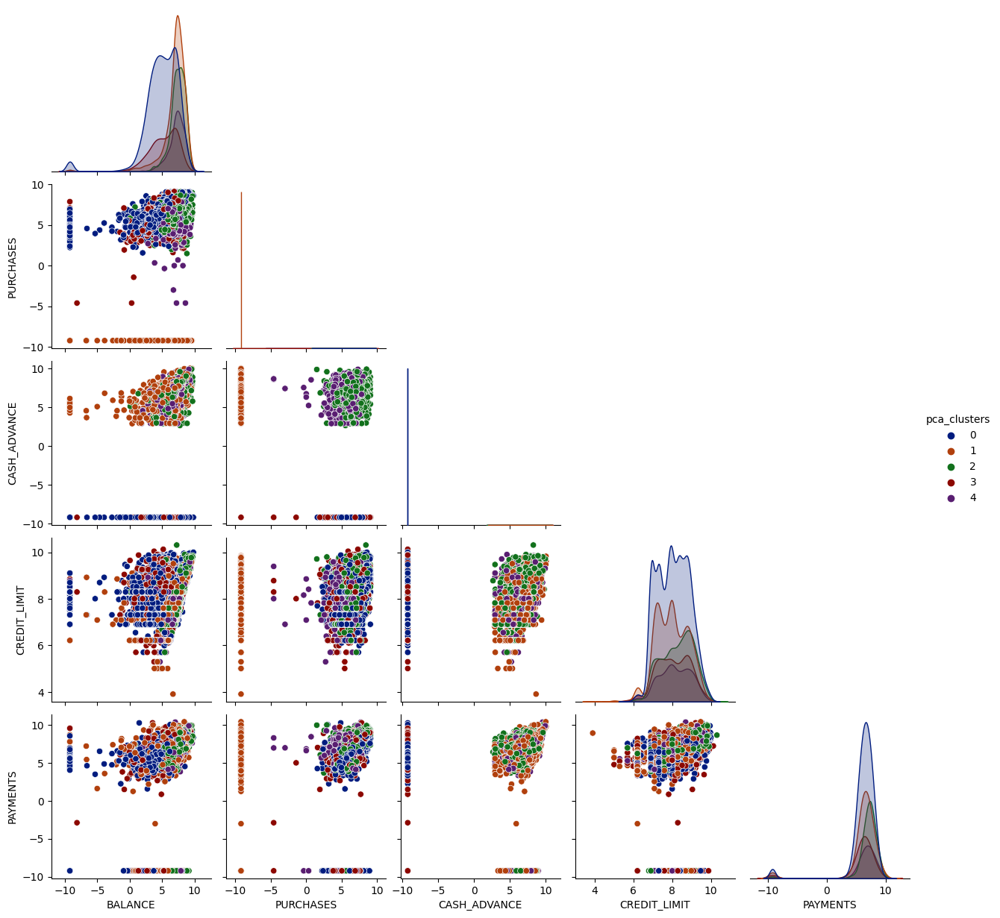

In [71]:
columns_to_plot = ['BALANCE','PURCHASES','CASH_ADVANCE', 'CREDIT_LIMIT' ,
                   'PAYMENTS', 'pca_clusters']
plt.figure(figsize=(20,20))
sns.pairplot(dfnew2[columns_to_plot],  hue='pca_clusters', corner=True , palette='dark' )

<Axes: xlabel='CASH_ADVANCE', ylabel='PURCHASES'>

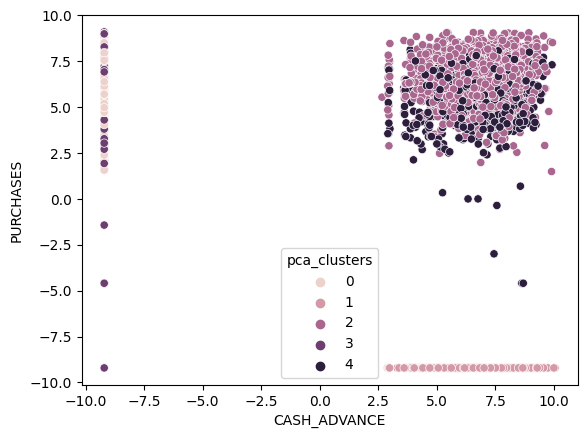

In [72]:
sns.scatterplot(data=dfnew2 , x='CASH_ADVANCE' , y='PURCHASES' , hue='pca_clusters')

### cluster 1 is Low purchases
### that is all we can conclude visually from pairplot

### plot normalized distribution of each cluster with certain features

In [73]:
dfnew_copy2 = dfnew_copy_original.copy()

In [74]:
dfnew_copy2['pca_clusters'] = kmeans7.labels_ 

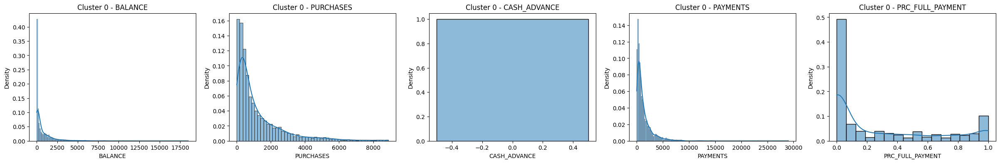

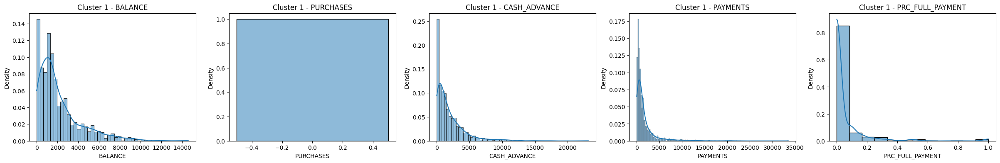

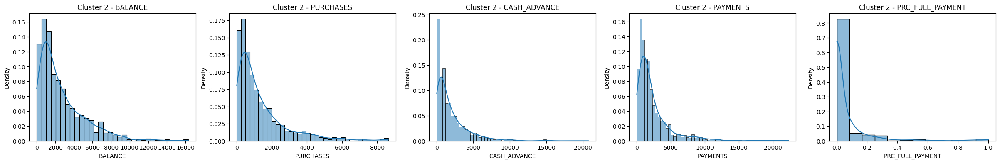

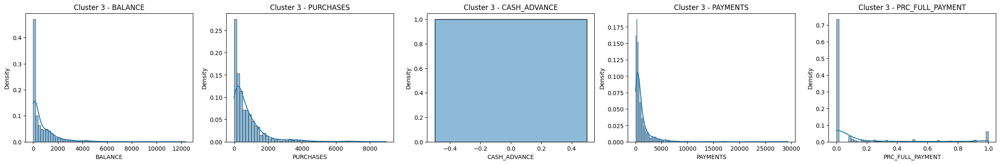

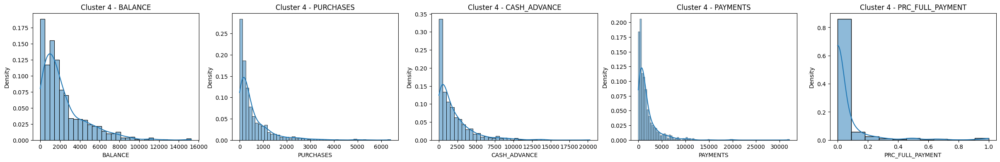

In [75]:
feature_columns = ['BALANCE','PURCHASES','CASH_ADVANCE' ,
                   'PAYMENTS','PRC_FULL_PAYMENT']

for cluster_label in sorted(dfnew_copy2['pca_clusters'].unique()):
    # Filter data points belonging to the current cluster
    cluster_data = dfnew_copy2[dfnew_copy2['pca_clusters'] == cluster_label]
    
    # Create subplots for each feature
    fig, axes = plt.subplots(1, len(feature_columns), figsize=(len(feature_columns) * 6, 4))
    
    # Plot normalized distribution for each feature
    for i, feature in enumerate(feature_columns):
        sns.histplot(cluster_data[feature], kde=True, ax=axes[i] , stat='proportion')
        axes[i].set_title(f'Cluster {cluster_label} - {feature}')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('Density')

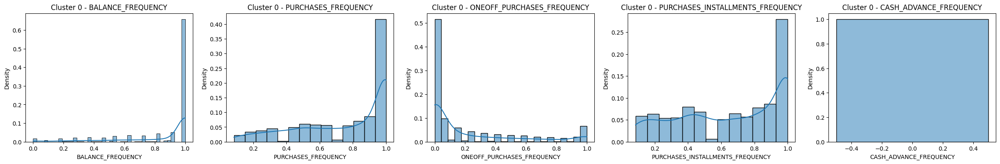

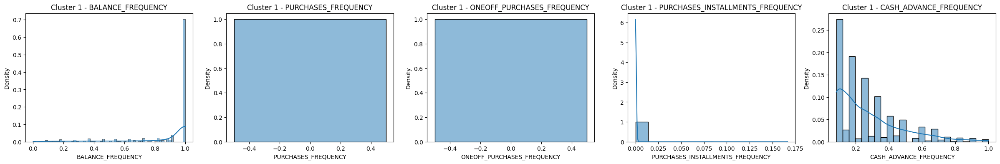

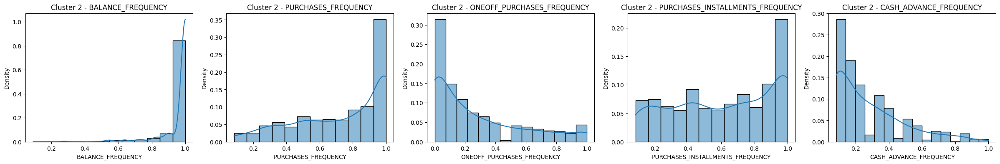

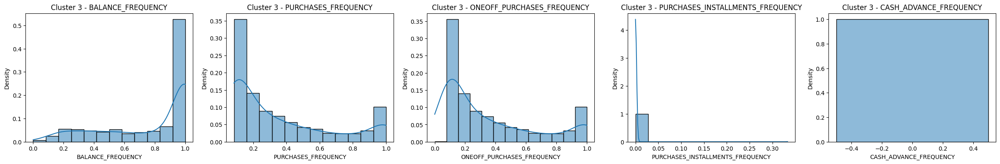

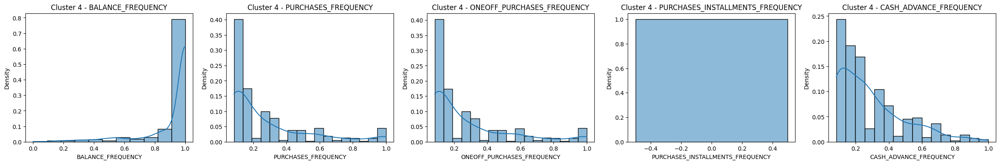

In [76]:
feature_columns = ['BALANCE_FREQUENCY' ,'PURCHASES_FREQUENCY','ONEOFF_PURCHASES_FREQUENCY',
                   'PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY']

for cluster_label in sorted(dfnew_copy2['pca_clusters'].unique()):
    # Filter data points belonging to the current cluster
    cluster_data = dfnew_copy2[dfnew_copy2['pca_clusters'] == cluster_label]
    
    # Create subplots for each feature
    fig, axes = plt.subplots(1, len(feature_columns), figsize=(len(feature_columns) * 6, 4))
    
    # Plot normalized distribution for each feature
    for i, feature in enumerate(feature_columns):
        sns.histplot(cluster_data[feature], kde=True, ax=axes[i] , stat='proportion' )
        axes[i].set_title(f'Cluster {cluster_label} - {feature}')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('Density')

### let's take what is most deffrentiating each cluster alone and try to label these clusters

# 8. business meaning for 5 clusters using kmeans

### cluster0(general cluster to cluster 4)

**users that have higher tendency to return payment and have higher purchase frequency**

### cluster1

**users that have zero purchases**

### cluster2

**Normal users that has balance in all features**

### cluster3

**same as cluster0**
**users that have low purchases and don't make any installment frequencies** 

**and also**

**they have low debt with no cash advance**

### cluster4

**users that have low purchases and don't make any installment frequencies** 


# 9. hierarchical clustering

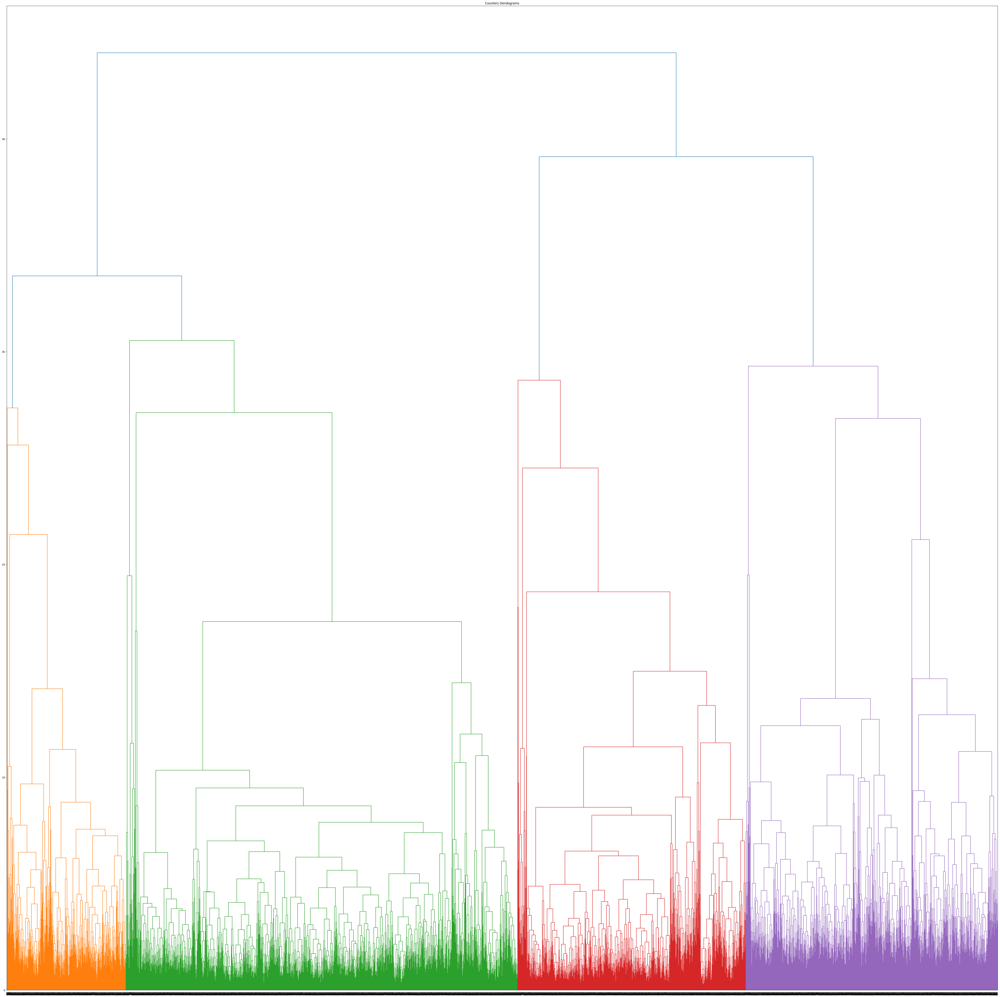

In [77]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(70, 70))
plt.title("Counters Dendograms")
dend = shc.dendrogram(shc.linkage(y=pca_data_without_scaling , method='complete',metric='euclidean')) #fill y with your dataframe
                                                                                      #and method with linkage criteria
                                                                                      #and metric with distance function

In [78]:
# number of clusters 
len(set(dend['color_list']))-1

4

seliouette score for linkage = complete and distance = euclidean and n_clusters = 3 is 0.6168199798806177


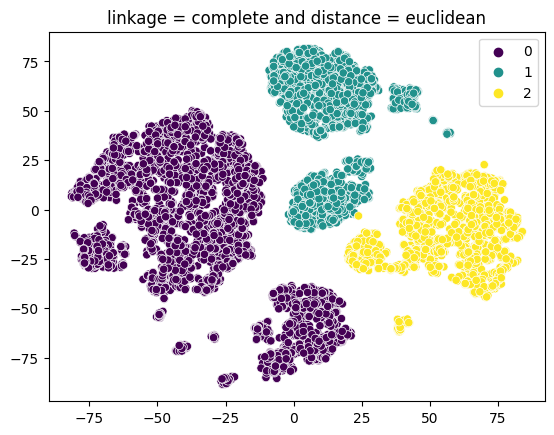

seliouette score for linkage = complete and distance = euclidean and n_clusters = 4 is 0.6589871039477737


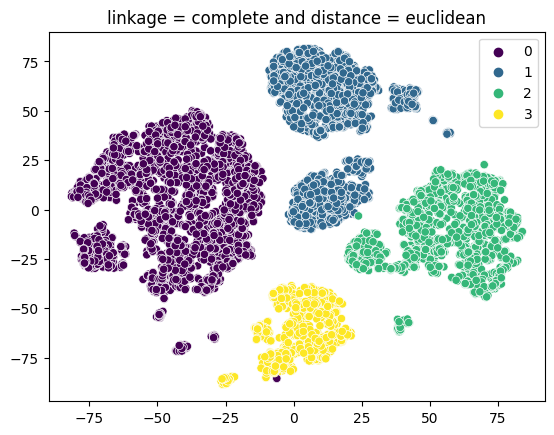

seliouette score for linkage = complete and distance = manhattan and n_clusters = 3 is 0.6097381959107124


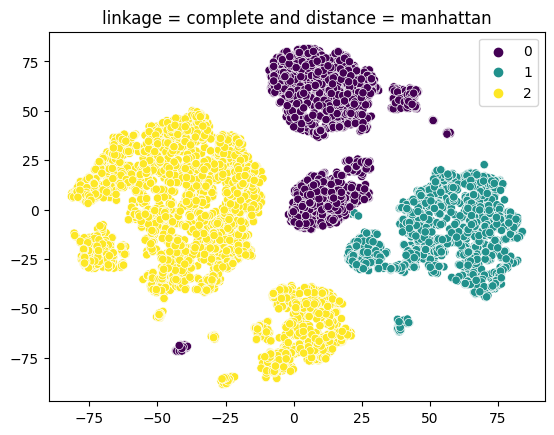

seliouette score for linkage = complete and distance = manhattan and n_clusters = 4 is 0.6115988961633965


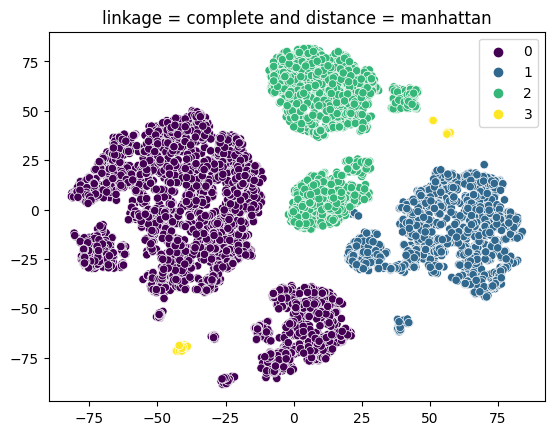

seliouette score for linkage = complete and distance = cosine and n_clusters = 3 is 0.49143028615926626


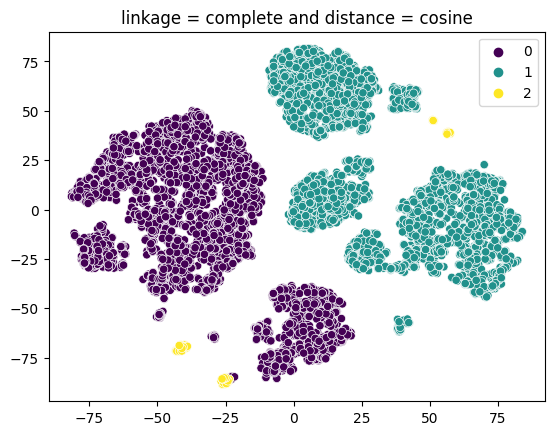

seliouette score for linkage = complete and distance = cosine and n_clusters = 4 is 0.5127942690351328


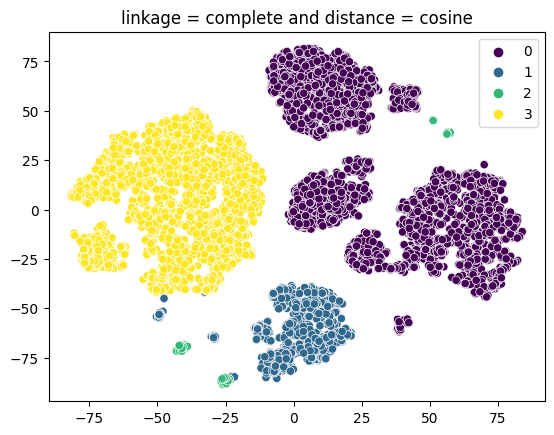

seliouette score for linkage = average and distance = euclidean and n_clusters = 3 is 0.6169507472610066


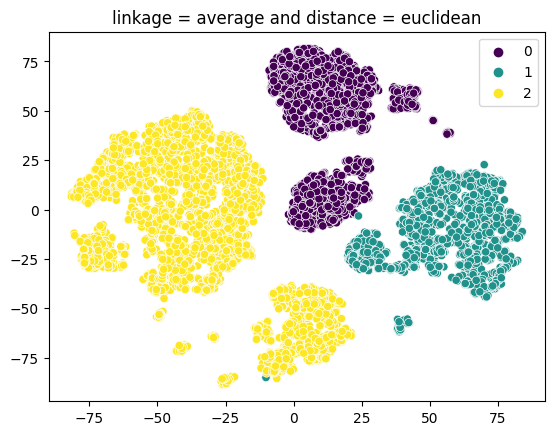

seliouette score for linkage = average and distance = euclidean and n_clusters = 4 is 0.6042139992588673


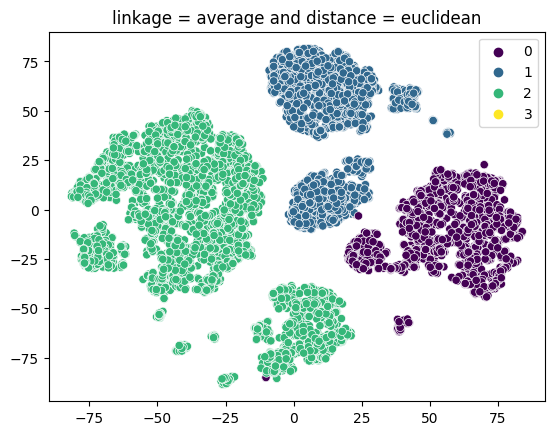

seliouette score for linkage = average and distance = manhattan and n_clusters = 3 is 0.13527295569054867


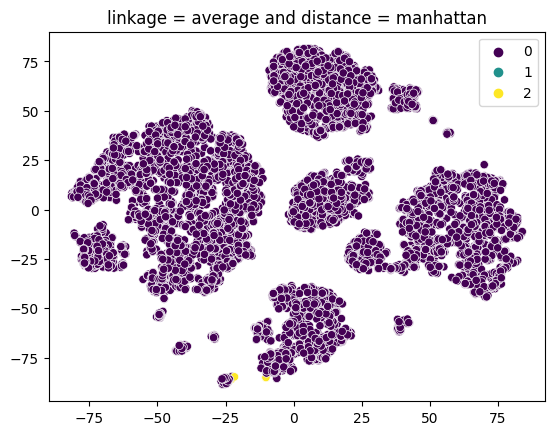

seliouette score for linkage = average and distance = manhattan and n_clusters = 4 is 0.4056182143707258


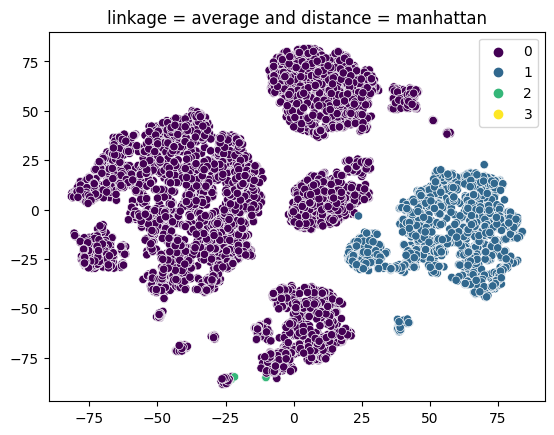

seliouette score for linkage = average and distance = cosine and n_clusters = 3 is 0.5808265068018789


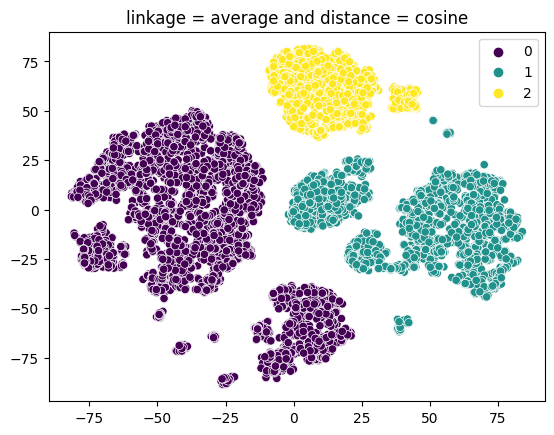

seliouette score for linkage = average and distance = cosine and n_clusters = 4 is 0.6283904407847487


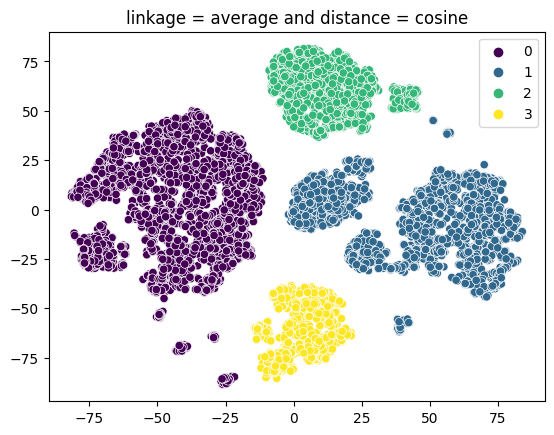

seliouette score for linkage = single and distance = euclidean and n_clusters = 3 is 0.4750051229473904


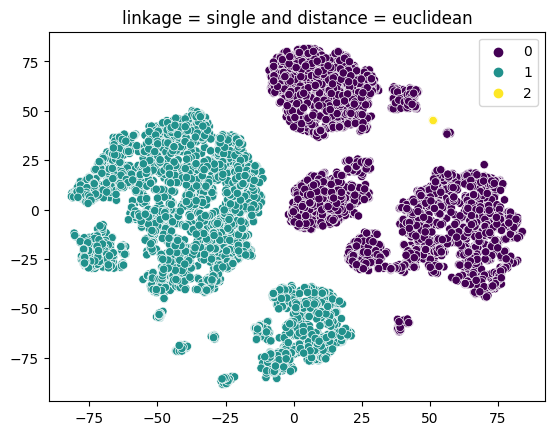

seliouette score for linkage = single and distance = euclidean and n_clusters = 4 is 0.43331299248572425


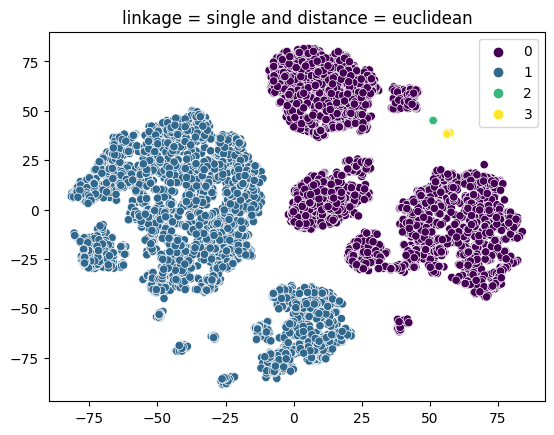

seliouette score for linkage = single and distance = manhattan and n_clusters = 3 is 0.02650172110059054


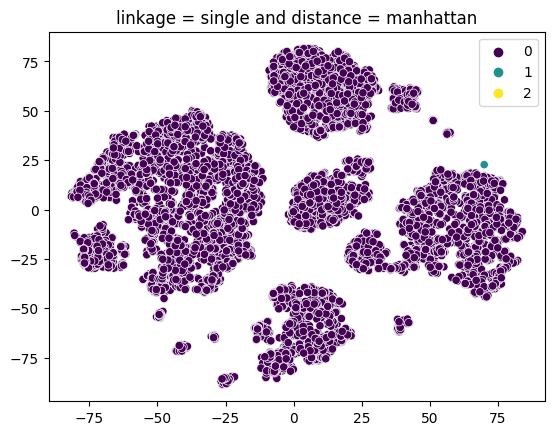

seliouette score for linkage = single and distance = manhattan and n_clusters = 4 is 0.33651523693525087


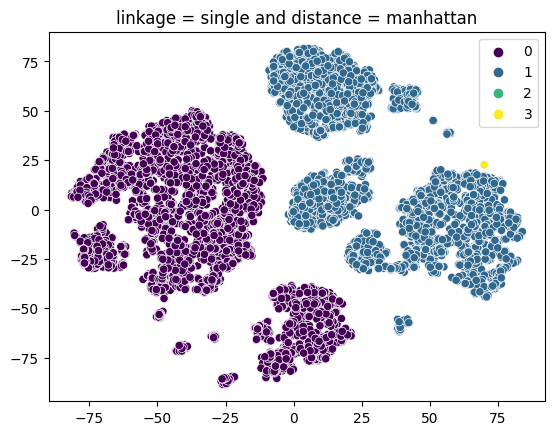

seliouette score for linkage = single and distance = cosine and n_clusters = 3 is 0.5829065777455441


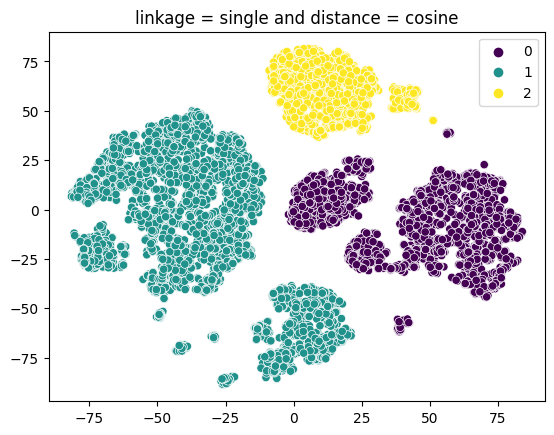

seliouette score for linkage = single and distance = cosine and n_clusters = 4 is 0.5250203830330008


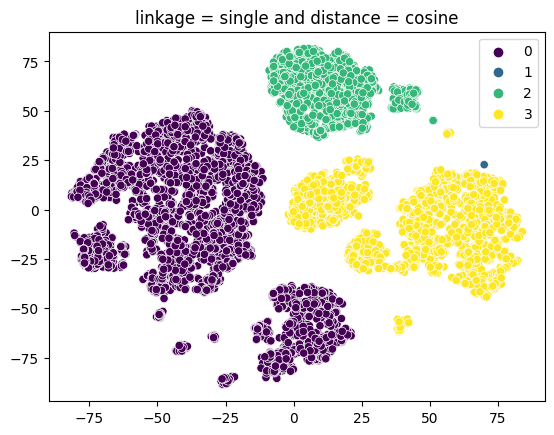

In [79]:
# using sillute score to determine the best hyperparameters
tsne = TSNE(n_components=2)
tsne_data = tsne.fit_transform(pca_data_without_scaling)

from sklearn.cluster import AgglomerativeClustering
n_clusters = np.arange(3,5)
linkage = ['complete', 'average', 'single']
distance = ['euclidean','manhattan', 'cosine']
inertia = []
for l in linkage:
    for d in distance:
        for i in n_clusters:
            agg = AgglomerativeClustering(n_clusters=i, linkage=l, affinity=d).fit(pca_data_without_scaling)
            print("seliouette score for linkage = {} and distance = {} and n_clusters = {} is {}".format(l, d, i, silhouette_score(pca_data_without_scaling, agg.labels_)))
            sns.scatterplot(x=tsne_data[:,:1].reshape(-1),y = tsne_data[:,1:].reshape(-1),hue=agg.labels_,palette='viridis')
            plt.title('linkage = {} and distance = {}'.format(l, d))
            silhouette_score(pca_data_without_scaling, agg.fit_predict(pca_data_without_scaling))
            plt.show()

In [85]:
# this is the best hyperparameters 
#seliouette score for linkage = complete and distance = euclidean and n_clusters = 4 is 0.6589871039477734
agg = AgglomerativeClustering(n_clusters=4, linkage='complete', affinity='euclidean').fit(pca_data_without_scaling)


In [86]:
dfnew2['hirarichal_clusters'] = agg.labels_

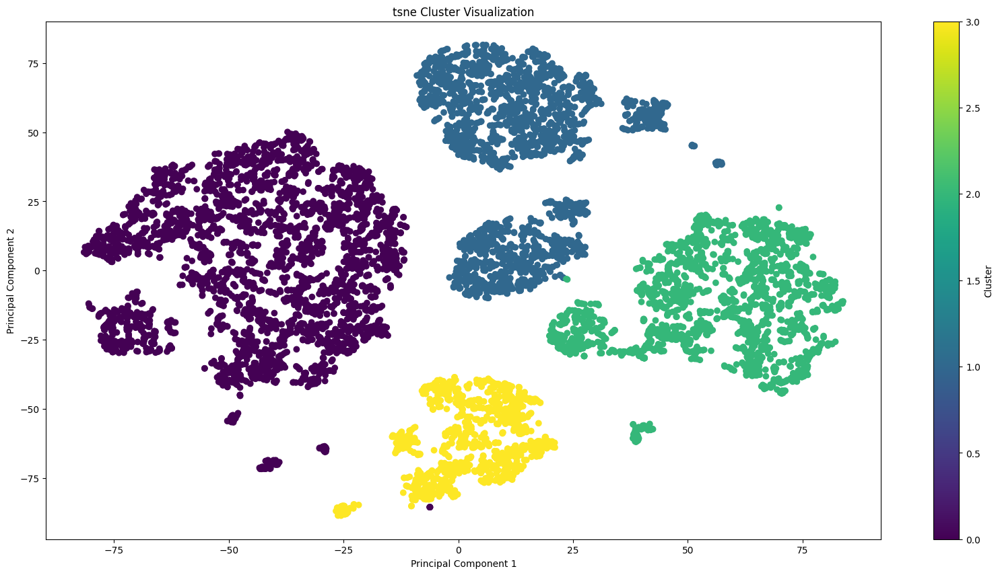

In [87]:
draw_tsne(pca_data_without_scaling , c=agg.labels_)

In [88]:
dfnew_copy3 = dfnew_copy_original.copy()

In [89]:
dfnew_copy3['hirarichal_clusters'] = agg.labels_ 

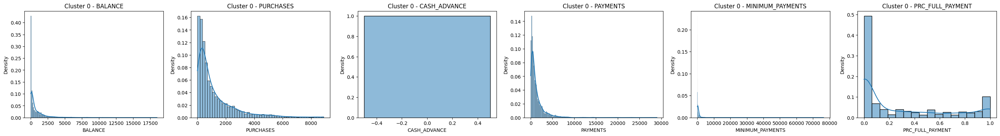

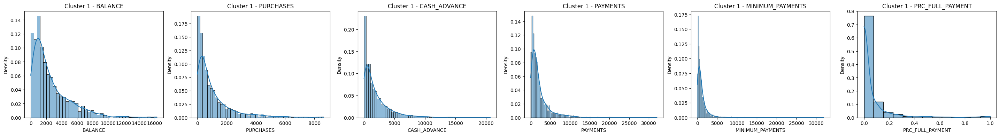

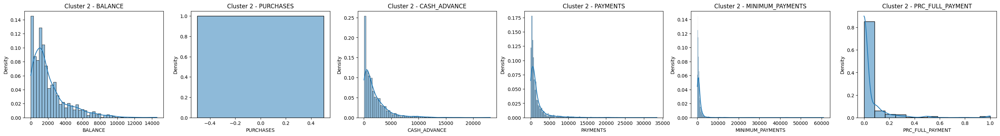

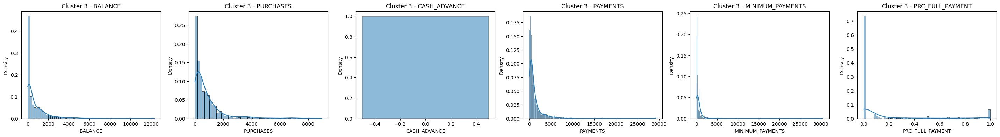

In [90]:
feature_columns = ['BALANCE','PURCHASES','CASH_ADVANCE' ,
                   'PAYMENTS', 'MINIMUM_PAYMENTS','PRC_FULL_PAYMENT']

for cluster_label in sorted(dfnew_copy3['hirarichal_clusters'].unique()):
    # Filter data points belonging to the current cluster
    cluster_data = dfnew_copy3[dfnew_copy3['hirarichal_clusters'] == cluster_label]
    
    # Create subplots for each feature
    fig, axes = plt.subplots(1, len(feature_columns), figsize=(len(feature_columns) * 6, 4))
    
    # Plot normalized distribution for each feature
    for i, feature in enumerate(feature_columns):
        sns.histplot(cluster_data[feature], kde=True, ax=axes[i] , stat='proportion')
        axes[i].set_title(f'Cluster {cluster_label} - {feature}')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('Density')

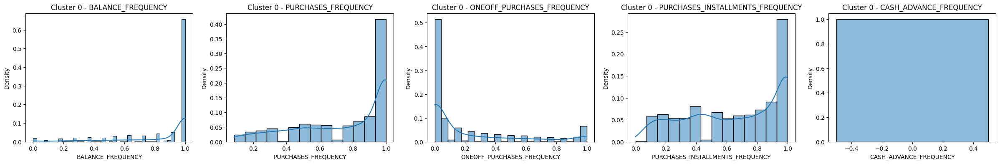

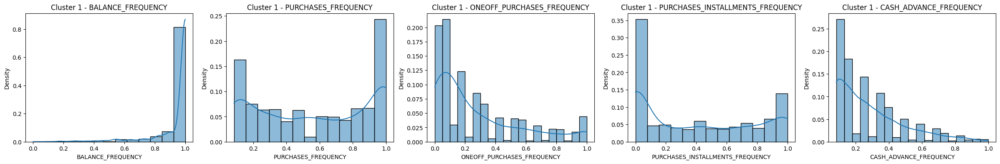

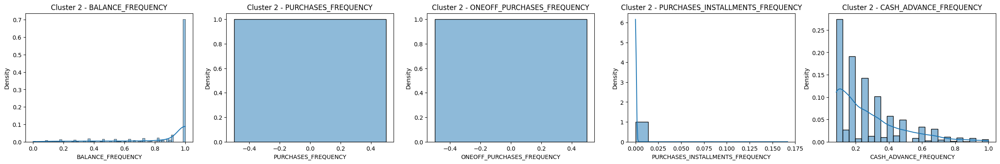

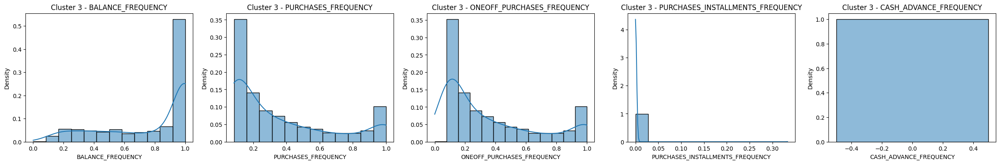

In [91]:
feature_columns = ['BALANCE_FREQUENCY' ,'PURCHASES_FREQUENCY','ONEOFF_PURCHASES_FREQUENCY',
                   'PURCHASES_INSTALLMENTS_FREQUENCY','CASH_ADVANCE_FREQUENCY']

for cluster_label in sorted(dfnew_copy3['hirarichal_clusters'].unique()):
    # Filter data points belonging to the current cluster
    cluster_data = dfnew_copy3[dfnew_copy3['hirarichal_clusters'] == cluster_label]
    
    # Create subplots for each feature
    fig, axes = plt.subplots(1, len(feature_columns), figsize=(len(feature_columns) * 6, 4))
    
    # Plot normalized distribution for each feature
    for i, feature in enumerate(feature_columns):
        sns.histplot(cluster_data[feature], kde=True, ax=axes[i] , stat='proportion' )
        axes[i].set_title(f'Cluster {cluster_label} - {feature}')
        axes[i].set_xlabel(feature)
        axes[i].set_ylabel('Density')

# 10. business meaning for 4 clusters using hierarchical clustering

### cluster 0
users that don't prefer cash and prefer installment 

### cluster 1
normal users balance in every feature

### cluster 2
users with zero purchases <br>

### cluster 3
users that don't prefer cash or installment

# 11. Expectation Maximization Algorithm

In [92]:
dfnew_copy4 = dfnew_copy_original.copy()

In [97]:
from sklearn.mixture import GaussianMixture

# Initialize and fit Gaussian Mixture Model
gmm = GaussianMixture(n_components=4, random_state=42)  # Specify the number of components/clusters
gmm.fit(pca_data_without_scaling)

# Get cluster labels
labels = gmm.predict(pca_data_without_scaling)


In [94]:
dfnew_copy4['expectation clusters'] = labels

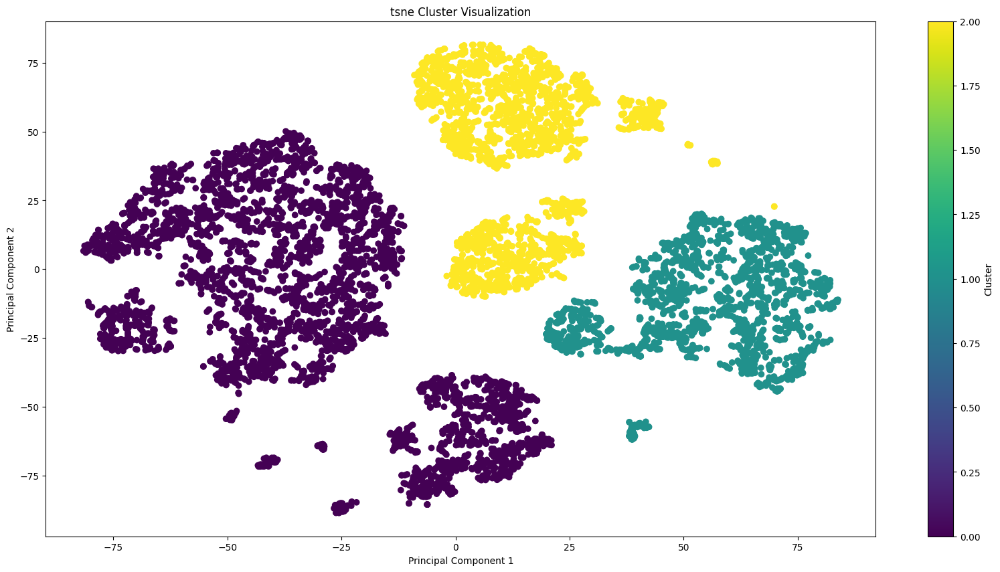

In [95]:
draw_tsne(pca_data_without_scaling , c=labels)

### we can see that the results are almost the same so I will use hirarechal results

### this is my final results that I will depend on

# 12. My final results

### cluster 0
users that don't prefer cash and prefer installment 

### cluster 1
normal users balance in every feature

### cluster 2
users with zero purchases <br>

### cluster 3
users that don't prefer cash or installment


### we can see that it's imortant for us to see people who have no purchases and who prefer installment and who don't prefer installment and who are normal users